### PREPARATION

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!mkdir /root/.kaggle

In [3]:
# !cp /content/drive/MyDrive/kaggle.json /root/.kaggle/
!cp /content/kaggle.json /root/.kaggle/

In [4]:
# !kaggle datasets download -d shawon10/ckplus
!kaggle datasets download -d shawon10/ckplus

  0% 0.00/3.63M [00:00<?, ?B/s]
100% 3.63M/3.63M [00:00<00:00, 190MB/s]


In [5]:
# %% Imports
import torch
import torch.nn as nn
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
import copy
import pandas as pd

In [6]:
import tensorflow as tf
from tensorflow import keras
import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sn
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from google.colab import drive

from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [7]:
# Set GPU device
print(torch.cuda.is_available())
device = torch.device("cuda:0")

True


In [8]:
!unzip 'ckplus.zip'

Archive:  ckplus.zip
  inflating: CK+48/anger/S010_004_00000017.png  
  inflating: CK+48/anger/S010_004_00000018.png  
  inflating: CK+48/anger/S010_004_00000019.png  
  inflating: CK+48/anger/S011_004_00000019.png  
  inflating: CK+48/anger/S011_004_00000020.png  
  inflating: CK+48/anger/S011_004_00000021.png  
  inflating: CK+48/anger/S014_003_00000028.png  
  inflating: CK+48/anger/S014_003_00000029.png  
  inflating: CK+48/anger/S014_003_00000030.png  
  inflating: CK+48/anger/S022_005_00000030.png  
  inflating: CK+48/anger/S022_005_00000031.png  
  inflating: CK+48/anger/S022_005_00000032.png  
  inflating: CK+48/anger/S026_003_00000013.png  
  inflating: CK+48/anger/S026_003_00000014.png  
  inflating: CK+48/anger/S026_003_00000015.png  
  inflating: CK+48/anger/S028_001_00000022.png  
  inflating: CK+48/anger/S028_001_00000023.png  
  inflating: CK+48/anger/S028_001_00000024.png  
  inflating: CK+48/anger/S029_001_00000017.png  
  inflating: CK+48/anger/S029_001_00000018.png  

In [9]:
# Auxiliary function for data distribution visualization
import cv2
def data_visualization(classes, data):
    # Define the color scheme for the bar graph
    colors = ['orange','red', 'blue', 'green', 'yellow', 'purple',  'violet']
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.bar(classes, data, color=colors)
    ax.set(title="Dataset's distribution for each Emotion class")
    ax.set(xlabel="Emotions", ylabel="#Images");
    ax.grid()


def load_data(data_path):
    subfolders_ck = os.listdir(data_path)

    print("[INFO] Dataset Loading...\n")

    img_data_list=[]
    labels_list = []
    num_images_per_class = []

    for category in subfolders_ck:
        img_list=os.listdir(data_path +'/'+ category)

        print('Loading :', len(img_list), 'images of category', category)
        for img in img_list:
            # Load an image from this path
            pixels=cv2.imread(data_path + '/'+ category + '/'+ img )
            face_array=cv2.resize(pixels, None, fx=1, fy=1,interpolation = cv2.INTER_CUBIC)

            img_data_list.append(face_array)
            labels_list.append(category)

        num_images_per_class.append(len(img_list))

    le = LabelEncoder()
    labels = le.fit_transform(labels_list)
    # labels = to_categorical(labels, 7)
    data = np.array(img_data_list)

    data_visualization(subfolders_ck, num_images_per_class)

    # Dataset Summary
    print("\nTotal number of uploaded data:", data.shape[0],
          ", with data shape", (data.shape[1],data.shape[2],data.shape[3]))

    return data, labels

In [11]:
# new code
import cv2

def data_visualization(classes, data):
    # Define the color scheme for the bar graph
    colors = ['orange','red', 'blue', 'green', 'yellow', 'purple',  'violet']
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.bar(classes, data, color=colors)
    ax.set(title="Dataset's distribution for each Emotion class")
    ax.set(xlabel="Emotions", ylabel="#Images");
    ax.grid()

def load_data(data_path):
    subfolders_ck = os.listdir(data_path)

    print("[INFO] Dataset Loading...\n")

    img_data_list=[]
    labels_list = []
    num_images_per_class = []

    for category in subfolders_ck:
        img_list=os.listdir(data_path +'/'+ category)

        print('Loading :', len(img_list), 'images of category', category)
        for img in img_list:
            # Load an image from this path
            pixels=cv2.imread(data_path + '/'+ category + '/'+ img )

            # Check if the image was loaded successfully
            if pixels is None:
                print(f"Error loading image: {data_path}/{category}/{img}")
                continue

            # Resize the image
            face_array=cv2.resize(pixels, None, fx=1, fy=1,interpolation = cv2.INTER_CUBIC)

            img_data_list.append(face_array)
            labels_list.append(category)

        num_images_per_class.append(len(img_list))

    le = LabelEncoder()
    labels = le.fit_transform(labels_list)
    data = np.array(img_data_list)

    data_visualization(subfolders_ck, num_images_per_class)

    # Dataset Summary
    print("\nTotal number of uploaded data:", data.shape[0],
          ", with data shape", (data.shape[1],data.shape[2],data.shape[3]))

    return data, labels


[INFO] Dataset Loading...

Loading : 135 images of category anger
Loading : 177 images of category disgust
Loading : 207 images of category happy
Loading : 75 images of category fear
Loading : 84 images of category sadness
Loading : 249 images of category surprise
Loading : 137 images of category train
Error loading image: /content/drive/MyDrive/CK+48/train/S011_004_00000020.png
Loading : 0 images of category val
Loading : 0 images of category test

Total number of uploaded data: 1063 , with data shape (48, 48, 3)


(1063,)

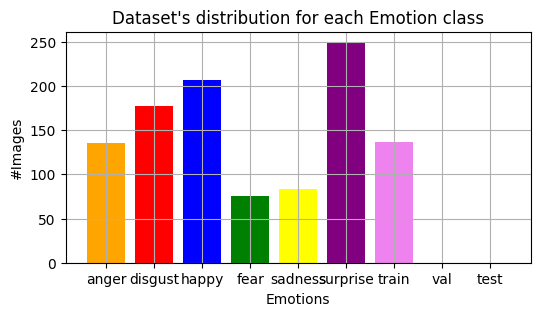

In [12]:
data_path_ck = '/content/drive/MyDrive/CK+48'
data, labels = load_data(data_path_ck)
l = labels
l.shape

In [13]:
from sklearn.model_selection import train_test_split

# assuming your dataset is stored in X and y arrays

# first split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

# then split the training data further into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


In [14]:
from tensorflow.keras.utils import to_categorical

# Assume that the y_train array is already defined as a 1D array of integers

# Convert y_train to categorical
num_classes = 7 # for example, if y_train contains 10 classes
y_train = to_categorical(y_train, num_classes)
# y_val = to_categorical(y_val, num_classes)
y_test = to_categorical(y_test, num_classes)

In [15]:
X_train.shape, y_train.shape,  X_test.shape, y_test.shape

((850, 48, 48, 3), (850, 7), (213, 48, 48, 3), (213, 7))

In [16]:
import torchvision.transforms as transforms
from torch.utils.data import Dataset

class CustomDataset(Dataset):
    def __init__(self, data, labels, transform=None):
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        x = self.data[index]
        y = self.labels[index]
        if self.transform:
            x = self.transform(x)
        return x, y

train_dataset = CustomDataset(X_train, y_train, transform=transforms.Compose([
                            transforms.Resize((255, 255)),
                            transforms.ToTensor()
                        ]))

test_dataset = CustomDataset(X_test, y_test, transform=transforms.Compose([
                            transforms.Resize((255, 255)),
                            transforms.ToTensor()
                        ]))


In [17]:
batch_size = 64
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=True
)

In [18]:
import os
import shutil
import random

data_dir = '/content/CK+48'  # Replace with the actual path to your CKPlus dataset
train_dir = '/content/train_dir'  # Replace with the path where you want to store the training set
test_dir = '/content/test_dir'  # Replace with the path where you want to store the testing set
test_ratio = 0.2  # The ratio of data to be used for testing

# Create the train and test directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Iterate over the subfolders and randomly assign them to the train or test set
for emo_folder in os.listdir(data_dir):
    emo_path = os.path.join(data_dir, emo_folder)
    if not os.path.isdir(emo_path):
        continue
    images = os.listdir(emo_path)
    num_test = int(len(images) * test_ratio)
    test_images = random.sample(images, num_test)
    for img in images:
        src = os.path.join(emo_path, img)
        if img in test_images:
            dst = os.path.join(test_dir, emo_folder, img)
        else:
            dst = os.path.join(train_dir, emo_folder, img)
        os.makedirs(os.path.dirname(dst), exist_ok=True)
        shutil.copy(src, dst)


In [19]:
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.vgg16 = models.vgg16(pretrained=True)

        # Replace output layer according to our problem
        in_feats = self.vgg16.classifier[6].in_features
        self.vgg16.classifier[6] = nn.Linear(in_feats, 7)

    def forward(self, x):
        x = self.vgg16(x)
        return x

model = CNNModel()
model.to(device)
model

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 83.3MB/s]


CNNModel(
  (vgg16): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=True)
      (16):

In [20]:
# class CNNModel(nn.Module):
#     def __init__(self):
#         super(CNNModel, self).__init__()
#         self.vgg16 = models.vgg16(pretrained=True)

#         # Modify input layer to accept 1 channel
#         self.vgg16.features[0] = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1)

#         # Replace output layer according to our problem
#         in_feats = self.vgg16.classifier[6].in_features
#         self.vgg16.classifier[6] = nn.Linear(in_feats, 7)

#     def forward(self, x):
#         x = self.vgg16(x)
#         return x

# model = CNNModel()
# model.to(device)
# model


In [21]:
# %% Prepare data for pretrained model
train_dataset = torchvision.datasets.ImageFolder(
        root='/content/train_dir',
        transform=transforms.Compose([
                      transforms.Resize((255,255)),
                      transforms.ToTensor()
        ])
)

test_dataset = torchvision.datasets.ImageFolder(
        root='/content/test_dir',
        transform=transforms.Compose([
                      transforms.Resize((255,255)),
                      transforms.ToTensor()
        ])
)

In [22]:
batch_size = 64
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)
test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=True
)

In [23]:
# %% Train
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.00002)
epochs = 50

In [ ]:
#   # Iterate x epochs over the train data
# for epoch in range(epochs):
#     for i, batch in enumerate(train_loader, 0):
#         inputs, labels = batch
#         inputs = inputs.to(device)
#         labels = labels.to(device)
#         optimizer.zero_grad()
#         outputs = model(inputs)
#         # Labels are automatically one-hot-encoded
#         loss = cross_entropy_loss(outputs, labels)
#         loss.backward()
#         optimizer.step()
#         print("Epochs:",epoch,"of", epochs,loss)


In [ ]:
# # model.save("/content/drive/MyDrive/CK+_RAF_model_50Epo.pth")
# # Save your model to Google Drive
# torch.save(model.state_dict(), '/content/drive/MyDrive/CK_model_50Epo.pth')

In [24]:
model.load_state_dict(torch.load("/content/drive/MyDrive/CK_model_50Epo.pth"))

<All keys matched successfully>

In [25]:
import torch

# Load the saved model
# model = CNNModel()  # Replace YourModelClass with the actual class of your model
# model.load_state_dict(torch.load("/content/drive/MyDrive/CK+_RAF_model_50Epo.pth"))
model.eval()  # Set the model to evaluation mode

# Rest of your testing code
test_loss = 0
correct = 0
total = 0

with torch.no_grad():
    for batch in test_loader:
        inputs, labels = batch
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        loss = cross_entropy_loss(outputs, labels)
        test_loss += loss.item()

    test_loss /= len(test_loader)
    accuracy = 100 * correct / total

    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {accuracy:.2f}%")


Test Loss: 0.0000
Test Accuracy: 100.00%


In [26]:
import matplotlib.pyplot as plt

def generate_heatmap(pixel_relevance_scores):
    # Normalize the relevance scores between 0 and 1
    normalized_scores = (pixel_relevance_scores - np.min(pixel_relevance_scores)) / (np.max(pixel_relevance_scores) - np.min(pixel_relevance_scores))

    # Create the heatmap using the normalized relevance scores
    heatmap = plt.imshow(normalized_scores, cmap='jet')

    # Add a colorbar to the heatmap
    plt.colorbar(heatmap)

    # Show the generated heatmap
    plt.show()


In [27]:
# Testing the model accuracy
model.eval()  # Set the model to evaluation mode

test_loss = 0
correct = 0
total = 0

with torch.no_grad():
    for batch in test_loader:
        inputs, labels = batch
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        loss = cross_entropy_loss(outputs, labels)
        test_loss += loss.item()

    test_loss /= len(test_loader)
    accuracy = 100 * correct / total

    print(f"Test Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {accuracy:.2f}%")


Test Loss: 0.0000
Test Accuracy: 100.00%


In [28]:

# %% Inspect predictions for first batch test/train loader
import pandas as pd

inputs, labels = next(iter(test_loader))
# inputs, labels = next(iter(train_loader))
inputs = inputs.to(device)
labels = labels.numpy()
outputs = model(inputs).max(1).indices.detach().cpu().numpy()

comparison = pd.DataFrame()
print("Batch predictions:")
print(outputs)

comparison["actual"] = labels
comparison["predicted"] = outputs

print("\nComparison:")
print(comparison)

Batch predictions:
[2 1 2 2 3 1 5 0 5 4 5 0 0 6 0 1 4 6 3 2 4 6 3 0 2 4 2 6 2 6 6 6 6 6 4 0 6
 0 1 6 4 2 6 4 5 6 0 1 3 0 6 3 0 0 4 4 0 6 2 4 6 2 0 5]

Comparison:
    actual  predicted
0        2          2
1        1          1
2        2          2
3        2          2
4        3          3
..     ...        ...
59       4          4
60       6          6
61       2          2
62       0          0
63       5          5

[64 rows x 2 columns]


In [29]:
def new_layer(layer, g):
    """Clone a layer and pass its parameters through the function g."""
    layer = copy.deepcopy(layer)
    try: layer.weight = torch.nn.Parameter(g(layer.weight))
    except AttributeError: pass
    try: layer.bias = torch.nn.Parameter(g(layer.bias))
    except AttributeError: pass
    return layer

In [30]:
def dense_to_conv(layers):
    """ Converts a dense layer to a conv layer """
    newlayers = []
    for i,layer in enumerate(layers):
        if isinstance(layer, nn.Linear):
            newlayer = None
            if i == 0:
                m, n = 512, layer.weight.shape[0]
                newlayer = nn.Conv2d(m,n,7)
                newlayer.weight = nn.Parameter(layer.weight.reshape(n,m,7,7))
            else:
                m,n = layer.weight.shape[1],layer.weight.shape[0]
                newlayer = nn.Conv2d(m,n,1)
                newlayer.weight = nn.Parameter(layer.weight.reshape(n,m,1,1))
            newlayer.bias = nn.Parameter(layer.bias)
            newlayers += [newlayer]
        else:
            newlayers += [layer]
    return newlayers

In [31]:
def get_linear_layer_indices(model):
    offset = len(model.vgg16._modules['features']) + 1
    indices = []
    for i, layer in enumerate(model.vgg16._modules['classifier']):
        if isinstance(layer, nn.Linear):
            indices.append(i)
    indices = [offset + val for val in indices]
    return indices

In [32]:
def apply_lrp_on_vgg16(model, image):
    image = torch.unsqueeze(image, 0)
    # >>> Step 1: Extract layers
    layers = list(model.vgg16._modules['features']) \
                + [model.vgg16._modules['avgpool']] \
                + dense_to_conv(list(model.vgg16._modules['classifier']))
    linear_layer_indices = get_linear_layer_indices(model)
    # >>> Step 2: Propagate image through layers and store activations
    n_layers = len(layers)
    activations = [image] + [None] * n_layers # list of activations

    for layer in range(n_layers):
        if layer in linear_layer_indices:
            if layer == 32:
                activations[layer] = activations[layer].reshape((1, 512, 7, 7))
        activation = layers[layer].forward(activations[layer])
        if isinstance(layers[layer], torch.nn.modules.pooling.AdaptiveAvgPool2d):
            activation = torch.flatten(activation, start_dim=1)
        activations[layer+1] = activation

    # >>> Step 3: Replace last layer with one-hot-encoding
    output_activation = activations[-1].detach().cpu().numpy()
    max_activation = output_activation.max()
    one_hot_output = [val if val == max_activation else 0
                        for val in output_activation[0]]

    activations[-1] = torch.FloatTensor([one_hot_output]).to(device)

    # >>> Step 4: Backpropagate relevance scores
    relevances = [None] * n_layers + [activations[-1]]
    # Iterate over the layers in reverse order
    for layer in range(0, n_layers)[::-1]:
        current = layers[layer]
        # Treat max pooling layers as avg pooling
        if isinstance(current, torch.nn.MaxPool2d):
            layers[layer] = torch.nn.AvgPool2d(2)
            current = layers[layer]
        if isinstance(current, torch.nn.Conv2d) or \
           isinstance(current, torch.nn.AvgPool2d) or\
           isinstance(current, torch.nn.Linear):
            activations[layer] = activations[layer].data.requires_grad_(True)

            # Apply variants of LRP depending on the depth
            # see: https://link.springer.com/chapter/10.1007%2F978-3-030-28954-6_10
            # Lower layers, LRP-gamma >> Favor positive contributions (activations)
            if layer <= 16:       rho = lambda p: p + 0.25*p.clamp(min=0); incr = lambda z: z+1e-9
            # Middle layers, LRP-epsilon >> Remove some noise / Only most salient factors survive
            if 17 <= layer <= 30: rho = lambda p: p;                       incr = lambda z: z+1e-9+0.25*((z**2).mean()**.5).data
            # Upper Layers, LRP-0 >> Basic rule
            if layer >= 31:       rho = lambda p: p;                       incr = lambda z: z+1e-9

            # Transform weights of layer and execute forward pass
            z = incr(new_layer(layers[layer],rho).forward(activations[layer]))
            # Element-wise division between relevance of the next layer and z
            s = (relevances[layer+1]/z).data
            # Calculate the gradient and multiply it by the activation
            (z * s).sum().backward();
            c = activations[layer].grad
            # Assign new relevance values
            relevances[layer] = (activations[layer]*c).data
        else:
            relevances[layer] = relevances[layer+1]

    # >>> Potential Step 5: Apply different propagation rule for pixels
    return relevances[0]

### test

<ipython-input-32-3641deb26041>:27: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  activations[-1] = torch.FloatTensor([one_hot_output]).to(device)


Original label :  1 | Groundtruth for this image:  contempt


<ipython-input-33-c588761682f4>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


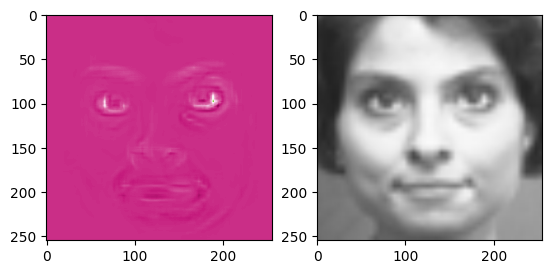

In [33]:
# %%
# Calculate relevances for a image in this test batch
# 3, 4, 5, 7
image_id = 1
# image_id = 12
image_relevances = apply_lrp_on_vgg16(model, inputs[image_id])
image_relevances = image_relevances.permute(0,2,3,1).detach().cpu().numpy()[0]
image_relevances = np.interp(image_relevances, (image_relevances.min(),
                                                image_relevances.max()),
                                                (0, 1))
# Show relevances
pred_label = list(test_dataset.class_to_idx.keys())[
             list(test_dataset.class_to_idx.values())
            .index(labels[image_id])]
if outputs[image_id] == labels[image_id]:
    print("Original label : ", labels[image_id], "| Groundtruth for this image: ", pred_label)

    # Plot images next to each other
    plt.axis('off')
    plt.subplot(1,2,1)
    # plt.imshow(image_relevances[:,:,0], cmap="seismic")
    plt.imshow(image_relevances[:,:,0], cmap="PiYG")
    plt.subplot(1,2,2)
    plt.imshow(inputs[image_id].permute(1,2,0).detach().cpu().numpy())
    plt.show()
else:
    print("This image is not classified correctly.")


In [34]:
# Get the input image
input_image = inputs[image_id]

# Apply LRP on the input image to get the relevance scores
image_relevances = apply_lrp_on_vgg16(model, input_image)
image_relevances = image_relevances.permute(0, 2, 3, 1).detach().cpu().numpy()[0]

# Get the relevance scores for each pixel in the input image
# pixel_relevance_scores = input_image.detach().cpu().numpy() * image_relevances
pixel_relevance_scores = input_image.detach().cpu().numpy() * np.transpose(image_relevances, (2, 0, 1))
print(pixel_relevance_scores)

[[[ 6.3009531e-05  2.9011123e-04  3.1153005e-04 ...  9.9897406e-06
    3.2003354e-06  3.2174646e-07]
  [ 6.9400048e-05  2.2456567e-04  2.2213110e-04 ...  1.1520217e-05
    4.7527324e-06  1.3492793e-06]
  [ 6.5223969e-05  2.0922492e-04  2.1279555e-04 ...  1.0174769e-05
    5.0083891e-06  2.6294738e-06]
  ...
  [ 3.7135546e-08 -5.9800819e-08 -2.6165040e-08 ...  3.4938250e-08
    2.6065448e-08  1.5021245e-08]
  [ 4.7452411e-09 -4.2354646e-08 -1.7956950e-08 ...  2.2690898e-08
    2.1263112e-08  4.7147131e-09]
  [ 2.7335835e-08  1.1399092e-09  1.3609984e-08 ... -1.5445501e-08
   -7.4715878e-09 -1.8669832e-09]]

 [[ 1.6333495e-04  4.9484376e-04  4.4293434e-04 ...  1.6634207e-05
    6.1905789e-06  3.0244422e-07]
  [ 1.7200061e-04  3.7911284e-04  2.2810203e-04 ...  1.7399576e-05
    8.2151973e-06  1.3520548e-06]
  [ 1.8792057e-04  3.8552750e-04  2.5721293e-04 ...  1.9956480e-05
    1.0545893e-05  3.9243123e-06]
  ...
  [-4.0270496e-08 -1.5229547e-07  5.6509109e-08 ...  4.5184088e-08
    5.4330

In [ ]:
mean_relevance_score = np.mean(pixel_relevance_scores)
print(mean_relevance_score)

6.6181e-05


In [35]:
import matplotlib.pyplot as plt

def generate_heatmap(pixel_relevance_scores):
    # Normalize the relevance scores between 0 and 1
    normalized_scores = (pixel_relevance_scores - np.min(pixel_relevance_scores)) / (np.max(pixel_relevance_scores) - np.min(pixel_relevance_scores))

    # Create the heatmap using the normalized relevance scores
    heatmap = plt.imshow(normalized_scores, cmap='jet')

    # Add a colorbar to the heatmap
    plt.colorbar(heatmap)

    # Show the generated heatmap
    plt.show()


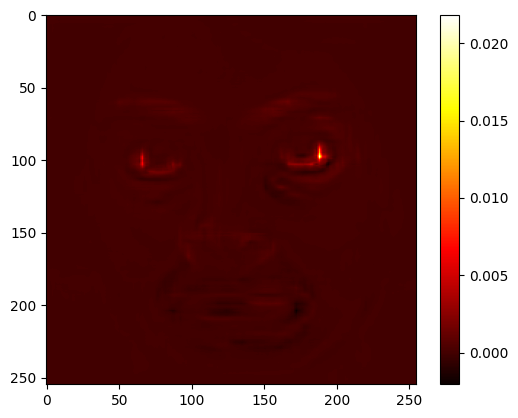

<Figure size 1000x1000 with 0 Axes>

In [36]:
import matplotlib.pyplot as plt

# Select the channel for which you want to generate the heatmap
channel_index = 2  # Change this to the desired channel index (0, 1, or 2)

# Get the relevance scores for the selected channel
relevance_scores = pixel_relevance_scores[channel_index]

# Generate the heatmap
heatmap = plt.imshow(relevance_scores, cmap='hot')
plt.colorbar(heatmap)

# Display the heatmap
plt.figure(figsize=(10.0, 10.0))
plt.show()


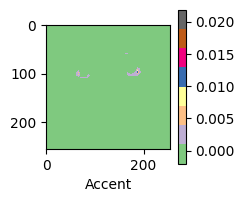

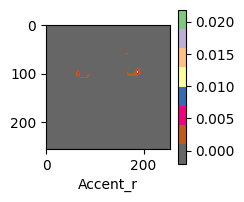

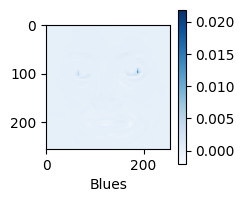

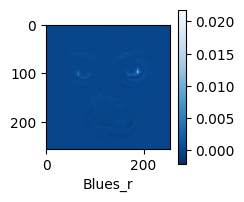

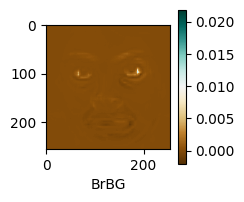

...

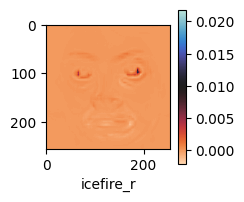

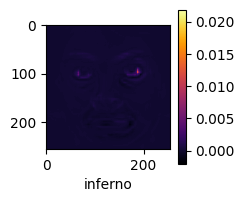

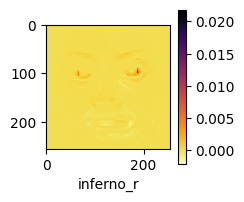

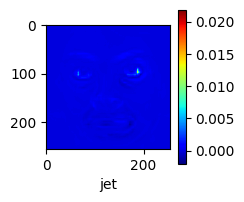

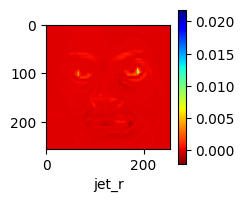

In [37]:
import matplotlib.pyplot as plt

# Select the channel for which you want to generate the heatmap
channel_index = 2  # Change this to the desired channel index (0, 1, or 2)

# Get the relevance scores for the selected channel
relevance_scores = pixel_relevance_scores[channel_index]

# Generate the heatmap with the desired size

cmaps = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r']
for c in cmaps:
    plt.figure(figsize=(2, 2))  # Set the desired size of the heatmap
    heatmap = plt.imshow(relevance_scores, cmap=c)  # Set the extent to match the size of the heatmap
    plt.xlabel(c)
    # Add a colorbar
    plt.colorbar(heatmap)

    # Display the heatmap
    plt.show()


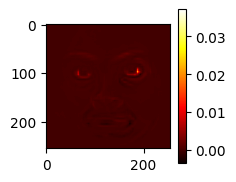

In [38]:
import matplotlib.pyplot as plt

# Select the channel for which you want to generate the heatmap
channel_index = 0  # Change this to the desired channel index (0, 1, or 2)

# Get the relevance scores for the selected channel
relevance_scores = pixel_relevance_scores[channel_index]

# Generate the heatmap
plt.figure(figsize = (2, 2))
heatmap = plt.imshow(relevance_scores, cmap='hot')
plt.colorbar(heatmap)

# Display the heatmap
plt.show()

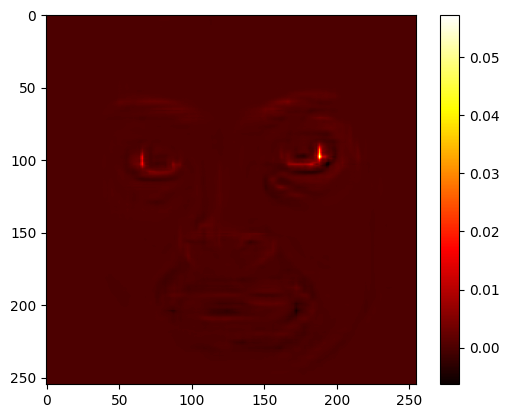

In [39]:
import matplotlib.pyplot as plt

# Select the channel for which you want to generate the heatmap
channel_index = 1  # Change this to the desired channel index (0, 1, or 2)

# Get the relevance scores for the selected channel
relevance_scores = pixel_relevance_scores[channel_index]

# Generate the heatmap
heatmap = plt.imshow(relevance_scores, cmap='hot')
plt.colorbar(heatmap)

# Display the heatmap
plt.show()

In [69]:
print(z_count, p_count)

0 0


*Fixing of lambda value*

In [65]:
image_id = 1
# image_id = 12
image_relevances = apply_lrp_on_vgg16(model, inputs[image_id])
image_relevances = image_relevances.permute(0,2,3,1).detach().cpu().numpy()[0]
image_relevances = np.interp(image_relevances, (image_relevances.min(),
                                                image_relevances.max()),
                                                (0, 1))
# Show relevances
pred_label = list(train_dataset.class_to_idx.keys())[
             list(train_dataset.class_to_idx.values())
            .index(labels[image_id])]
if outputs[image_id] == labels[image_id]:
    print("Original label : ", labels[image_id], "| Groundtruth for this image: ", pred_label)

    # Plot images next to each other
    plt.axis('off')
    plt.subplot(1,2,1)
    # plt.imshow(image_relevances[:,:,0], cmap="seismic")
    plt.imshow(image_relevances[:,:,0], cmap="PiYG")
    plt.subplot(1,2,2)
    plt.imshow(inputs[image_id].permute(1,2,0).detach().cpu().numpy())
    plt.show()
else:
    print("This image is not classified correctly.")

IndexError: index 1 is out of bounds for dimension 0 with size 1

In [63]:
# Specify the class you want to visualize
target_class = "happy"

# Find the index of the target class in the list of class labels
class_index = list(train_dataset.class_to_idx.keys()).index(target_class)

# Iterate through the images in the dataset
for image_id in range(len(inputs)):
    image_relevances = apply_lrp_on_vgg16(model, inputs[image_id])
    image_relevances = image_relevances.permute(0, 2, 3, 1).detach().cpu().numpy()[0]
    image_relevances = np.interp(image_relevances, (image_relevances.min(), image_relevances.max()), (0, 1))

    # Check if the predicted label matches the target class
    if outputs[image_id] == class_index:
        pred_label = list(train_dataset.class_to_idx.keys())[outputs[image_id]]
        print("Original label:", labels[image_id], "| Groundtruth for this image:", pred_label)

        # Plot images next to each other
        plt.axis('off')
        plt.subplot(1, 2, 1)
        plt.imshow(image_relevances[:, :, 0], cmap="PiYG")
        plt.subplot(1, 2, 2)
        plt.imshow(inputs[image_id].permute(1, 2, 0).detach().cpu().numpy())
        plt.show()
    else:
        print("This image is not classified correctly.")


This image is not classified correctly.


### TEST 1

In [73]:
def pixel_contribution_dictionary(channel, pixel_relevance_scores):
    channel_index = channel  # Index of the channel you want to consider
    pixel_contribution_dict = {}

    # Iterate over the pixels in the channel
    for row in range(224):
        for col in range(224):
            pixel_value = pixel_relevance_scores[channel_index, row, col]
            total_contribution = np.sum(pixel_relevance_scores[channel_index])
            contribution_percentage = (pixel_value / total_contribution) * 100
            pixel_contribution_dict[(row, col)] = contribution_percentage
    return pixel_contribution_dict

In [71]:
def contributed_pixels_count(c, prs):
  z_count, p_count = 0,0
  for value in pixel_contribution_dictionary(c, prs).values():
      if value > 0:
        p_count = p_count + 1
      else:
        z_count = z_count + 1
  print("zero contributed : ", z_count,"and actively contributed : ", p_count)
  return p_count, z_count

exception
exception
exception
Groundtruth for this image: fear


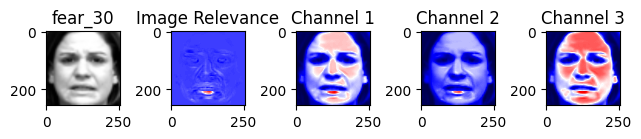

zero contributed :  747 and actively contributed :  49429
['fear_30']|[49429]|[747]
Groundtruth for this image: fear


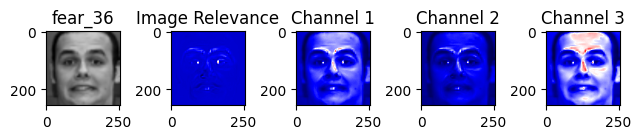

zero contributed :  3 and actively contributed :  50173
['fear_30', 'fear_36']|[49429, 50173]|[747, 3]
exception
exception
exception
exception
Groundtruth for this image: fear


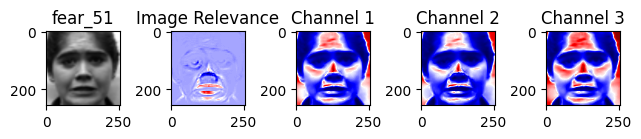

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51']|[49429, 50173, 50175]|[747, 3, 1]
Groundtruth for this image: fear


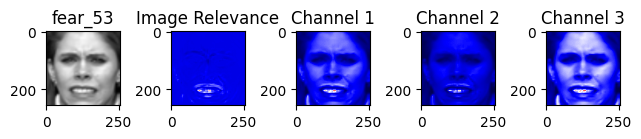

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53']|[49429, 50173, 50175, 50175]|[747, 3, 1, 1]
Groundtruth for this image: fear


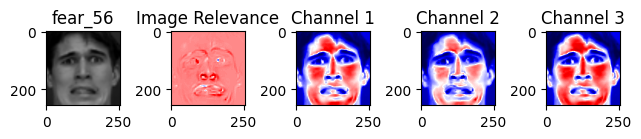

zero contributed :  1281 and actively contributed :  48895
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56']|[49429, 50173, 50175, 50175, 48895]|[747, 3, 1, 1, 1281]
exception
exception
Groundtruth for this image: fear


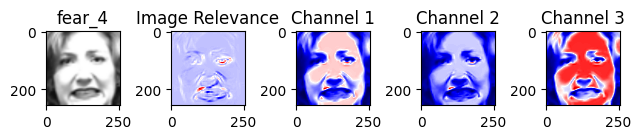

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4']|[49429, 50173, 50175, 50175, 48895, 50175]|[747, 3, 1, 1, 1281, 1]
exception
exception
exception
Groundtruth for this image: fear


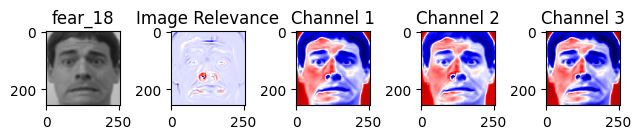

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18']|[49429, 50173, 50175, 50175, 48895, 50175, 50175]|[747, 3, 1, 1, 1281, 1, 1]
Groundtruth for this image: fear


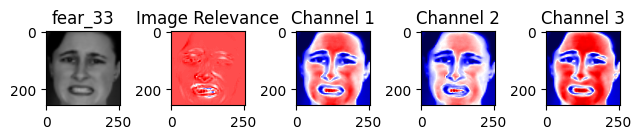

zero contributed :  2666 and actively contributed :  47510
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510]|[747, 3, 1, 1, 1281, 1, 1, 2666]
exception
exception
exception
exception
exception
Groundtruth for this image: fear


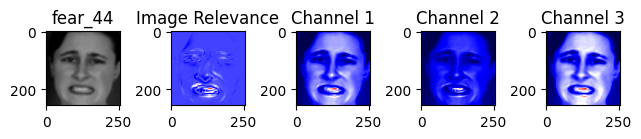

zero contributed :  2599 and actively contributed :  47577
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599]
exception
exception
Groundtruth for this image: fear


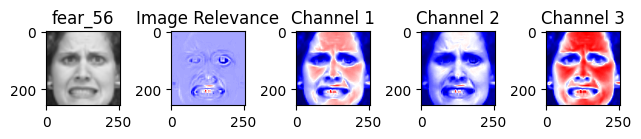

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1]
exception
Groundtruth for this image: fear


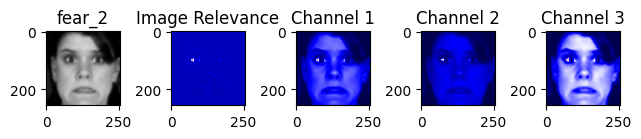

zero contributed :  1895 and actively contributed :  48281
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895]
exception
Groundtruth for this image: fear


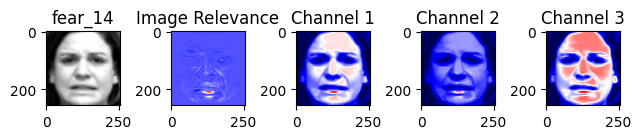

zero contributed :  831 and actively contributed :  49345
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831]
exception
exception
exception
Groundtruth for this image: fear


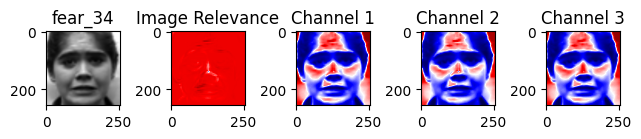

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1]
exception
exception
exception
Groundtruth for this image: fear


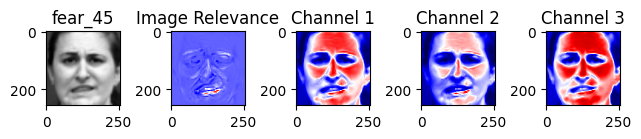

zero contributed :  65 and actively contributed :  50111
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65]
exception
exception
exception
exception
exception
exception
exception
exception
Groundtruth for this image: fear


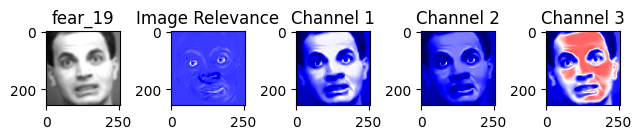

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1]
exception
exception
exception
exception
Groundtruth for this image: fear


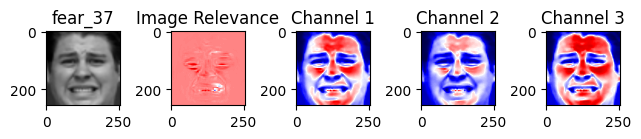

zero contributed :  827 and actively contributed :  49349
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827]
exception
Groundtruth for this image: fear


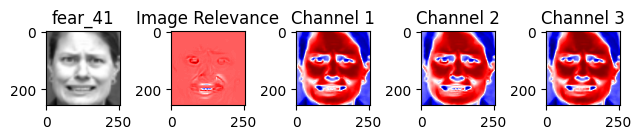

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1]
Groundtruth for this image: fear


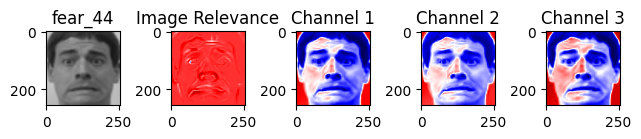

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1]
exception
exception
exception
Groundtruth for this image: fear


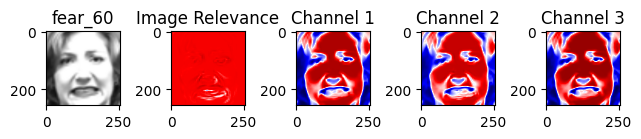

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44', 'fear_60']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1, 1]
exception
exception
exception
exception
exception
exception
exception
exception
Groundtruth for this image: fear


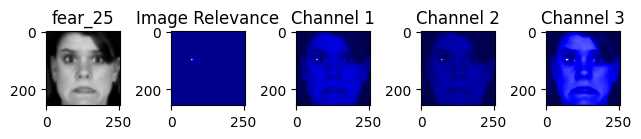

zero contributed :  1991 and actively contributed :  48185
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44', 'fear_60', 'fear_25']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175, 50175, 48185]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1, 1, 1991]
exception
exception
Groundtruth for this image: fear


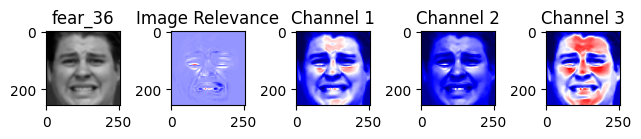

zero contributed :  1036 and actively contributed :  49140
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44', 'fear_60', 'fear_25', 'fear_36']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175, 50175, 48185, 49140]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1, 1, 1991, 1036]
exception
Groundtruth for this image: fear


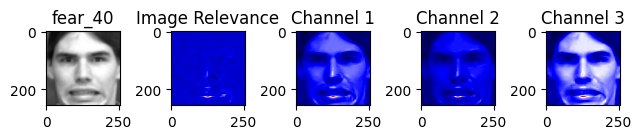

zero contributed :  1 and actively contributed :  50175
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44', 'fear_60', 'fear_25', 'fear_36', 'fear_40']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175, 50175, 48185, 49140, 50175]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1, 1, 1991, 1036, 1]
Groundtruth for this image: fear


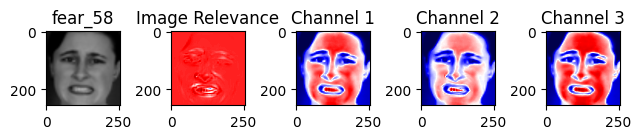

zero contributed :  2588 and actively contributed :  47588
['fear_30', 'fear_36', 'fear_51', 'fear_53', 'fear_56', 'fear_4', 'fear_18', 'fear_33', 'fear_44', 'fear_56', 'fear_2', 'fear_14', 'fear_34', 'fear_45', 'fear_19', 'fear_37', 'fear_41', 'fear_44', 'fear_60', 'fear_25', 'fear_36', 'fear_40', 'fear_58']|[49429, 50173, 50175, 50175, 48895, 50175, 50175, 47510, 47577, 50175, 48281, 49345, 50175, 50111, 50175, 49349, 50175, 50175, 50175, 48185, 49140, 50175, 47588]|[747, 3, 1, 1, 1281, 1, 1, 2666, 2599, 1, 1895, 831, 1, 65, 1, 827, 1, 1, 1, 1991, 1036, 1, 2588]
exception


KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

In [74]:
emotion_class = 'fear'  # Specify the emotion class for which you want to generate relevance scores

image_names = []
positive_counts = []
negative_counts = []

for inputs, labels in train_loader:
    inputs = inputs.to(device)
    outputs = model(inputs).max(1).indices.detach().cpu().numpy()

    for i in range(inputs.shape[0]):
        image_id = i

        try:
            image_relevances = apply_lrp_on_vgg16(model, inputs[image_id])
            image_relevances = image_relevances.permute(0, 2, 3, 1).detach().cpu().numpy()[0]
            image_relevances = np.interp(image_relevances, (image_relevances.min(), image_relevances.max()), (0, 1))
            pixel_relevance_scores = inputs[image_id].detach().cpu().numpy() * np.transpose(image_relevances, (2, 0, 1))
            # print(type(pixel_relevance_scores), len(pixel_relevance_scores))

            pred_label = list(train_dataset.class_to_idx.keys())[list(train_dataset.class_to_idx.values()).index(labels[image_id])]
            image_name = emotion_class+'_'+str(i)
            # Add condition to process images only for the specified emotion class
            if pred_label == emotion_class:
                if outputs[image_id] == labels[image_id]:
                    print("Groundtruth for this image:", pred_label)
                    plt.axis('off')
                    plt.gca().remove()

                    plt.subplot(1, 5, 1)
                    plt.imshow(inputs[image_id].permute(1, 2, 0).detach().cpu().numpy())
                    plt.title(image_name)

                    plt.subplot(1, 5, 2)
                    plt.imshow(image_relevances[:, :, 0], cmap="seismic")
                    plt.title("Image Relevance")

                    plt.subplot(1, 5, 3)
                    plt.imshow(pixel_relevance_scores[0], cmap="seismic")
                    plt.title("Channel 1")

                    plt.subplot(1, 5, 4)
                    plt.imshow(pixel_relevance_scores[1], cmap="seismic")
                    plt.title("Channel 2")

                    plt.subplot(1, 5, 5)
                    plt.imshow(pixel_relevance_scores[2], cmap="seismic")
                    plt.title("Channel 3")

                    plt.tight_layout()
                    plt.show()
                    plt.clf()

                    # print(contributed_pixels_count(0, pixel_relevance_scores))
                    p, z = contributed_pixels_count(1, pixel_relevance_scores)
                    # print(contributed_pixels_count(2, pixel_relevance_scores))

                    image_names.append(image_name)
                    positive_counts.append(p)
                    negative_counts.append(z)

                    print(image_names, positive_counts, negative_counts, sep="|")

        except TypeError:
            #print("exception")
            continue

In [75]:
data = zip(image_names, positive_counts, negative_counts)

In [76]:
from prettytable import PrettyTable

# Define the table
table = PrettyTable()
table.field_names = ["Image Name", "P_counts", "Z_counts"]
for a,b,c in data:
    table.add_row([a, b, c])

# Set the table border style
table.border = True

# Print the table
print(table)


+------------+----------+----------+
| Image Name | P_counts | Z_counts |
+------------+----------+----------+
|  fear_30   |  49429   |   747    |
|  fear_36   |  50173   |    3     |
|  fear_51   |  50175   |    1     |
|  fear_53   |  50175   |    1     |
|  fear_56   |  48895   |   1281   |
|   fear_4   |  50175   |    1     |
|  fear_18   |  50175   |    1     |
|  fear_33   |  47510   |   2666   |
|  fear_44   |  47577   |   2599   |
|  fear_56   |  50175   |    1     |
|   fear_2   |  48281   |   1895   |
|  fear_14   |  49345   |   831    |
|  fear_34   |  50175   |    1     |
|  fear_45   |  50111   |    65    |
|  fear_19   |  50175   |    1     |
|  fear_37   |  49349   |   827    |
|  fear_41   |  50175   |    1     |
|  fear_44   |  50175   |    1     |
|  fear_60   |  50175   |    1     |
|  fear_25   |  48185   |   1991   |
|  fear_36   |  49140   |   1036   |
|  fear_40   |  50175   |    1     |
|  fear_58   |  47588   |   2588   |
+------------+----------+----------+


#Relevance Calculation#

In [42]:
def get_pixel_count_in_range(array):
  array = array.flatten()
  count_range = []
  for i in range(10):
    x, y = i/10, (i+1)/10
    selected_values = array[np.logical_and(array > x, array <= y)]
    # print(selected_values)
    # Count the number of values in the range
    # count = np.count_nonzero(np.logical_and(array > x, array <= y))
    count = len(selected_values)
    # Print the count
    print("Contribution of pixels in the range [",x,y,"] is : ", count)
    count_range.append(count)
  return count_range


In [43]:
def calculate_range_by_mean5(array):
  pixel_count_in_range = get_pixel_count_in_range(array)
  m1 = sum(pixel_count_in_range[:5])
  m2 = sum(pixel_count_in_range[3:8])
  m3 = sum(pixel_count_in_range[5:])

  lmh = ["Low", "Medium", "High"]
  lmhv = [m1, m2, m3]

  intensity = lmh[lmhv.index(max(lmhv))]
  # print(intensity)
  return intensity


Groundtruth for this image: disgust


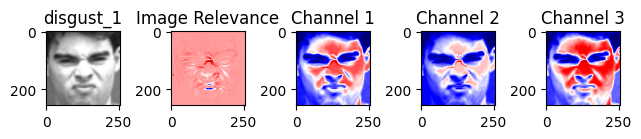

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  8
Contribution of pixels in the range [ 0.1 0.2 ] is :  23
Contribution of pixels in the range [ 0.2 0.3 ] is :  67
Contribution of pixels in the range [ 0.3 0.4 ] is :  243
Contribution of pixels in the range [ 0.4 0.5 ] is :  1411
Contribution of pixels in the range [ 0.5 0.6 ] is :  190322
Contribution of pixels in the range [ 0.6 0.7 ] is :  2751
Contribution of pixels in the range [ 0.7 0.8 ] is :  195
Contribution of pixels in the range [ 0.8 0.9 ] is :  43
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


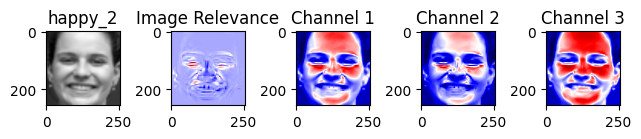

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  20
Contribution of pixels in the range [ 0.1 0.2 ] is :  75
Contribution of pixels in the range [ 0.2 0.3 ] is :  452
Contribution of pixels in the range [ 0.3 0.4 ] is :  7339
Contribution of pixels in the range [ 0.4 0.5 ] is :  182868
Contribution of pixels in the range [ 0.5 0.6 ] is :  3664
Contribution of pixels in the range [ 0.6 0.7 ] is :  497
Contribution of pixels in the range [ 0.7 0.8 ] is :  110
Contribution of pixels in the range [ 0.8 0.9 ] is :  27
Contribution of pixels in the range [ 0.9 1.0 ] is :  22
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


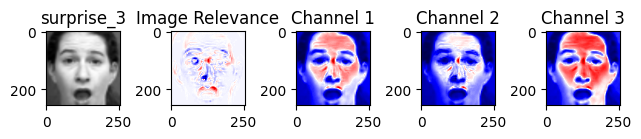

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  29
Contribution of pixels in the range [ 0.1 0.2 ] is :  118
Contribution of pixels in the range [ 0.2 0.3 ] is :  594
Contribution of pixels in the range [ 0.3 0.4 ] is :  10861
Contribution of pixels in the range [ 0.4 0.5 ] is :  182002
Contribution of pixels in the range [ 0.5 0.6 ] is :  1265
Contribution of pixels in the range [ 0.6 0.7 ] is :  164
Contribution of pixels in the range [ 0.7 0.8 ] is :  33
Contribution of pixels in the range [ 0.8 0.9 ] is :  5
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


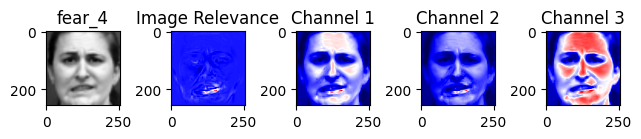

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  13
Contribution of pixels in the range [ 0.1 0.2 ] is :  63
Contribution of pixels in the range [ 0.2 0.3 ] is :  796
Contribution of pixels in the range [ 0.3 0.4 ] is :  190145
Contribution of pixels in the range [ 0.4 0.5 ] is :  3435
Contribution of pixels in the range [ 0.5 0.6 ] is :  465
Contribution of pixels in the range [ 0.6 0.7 ] is :  106
Contribution of pixels in the range [ 0.7 0.8 ] is :  28
Contribution of pixels in the range [ 0.8 0.9 ] is :  19
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


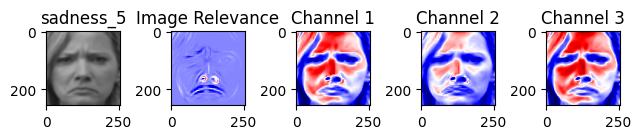

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  7
Contribution of pixels in the range [ 0.1 0.2 ] is :  20
Contribution of pixels in the range [ 0.2 0.3 ] is :  184
Contribution of pixels in the range [ 0.3 0.4 ] is :  2684
Contribution of pixels in the range [ 0.4 0.5 ] is :  188734
Contribution of pixels in the range [ 0.5 0.6 ] is :  2952
Contribution of pixels in the range [ 0.6 0.7 ] is :  418
Contribution of pixels in the range [ 0.7 0.8 ] is :  66
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


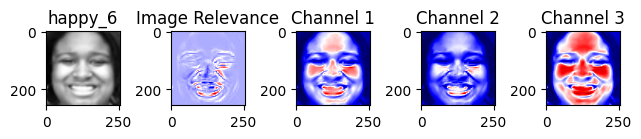

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  12
Contribution of pixels in the range [ 0.2 0.3 ] is :  109
Contribution of pixels in the range [ 0.3 0.4 ] is :  707
Contribution of pixels in the range [ 0.4 0.5 ] is :  114510
Contribution of pixels in the range [ 0.5 0.6 ] is :  77088
Contribution of pixels in the range [ 0.6 0.7 ] is :  2342
Contribution of pixels in the range [ 0.7 0.8 ] is :  265
Contribution of pixels in the range [ 0.8 0.9 ] is :  36
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


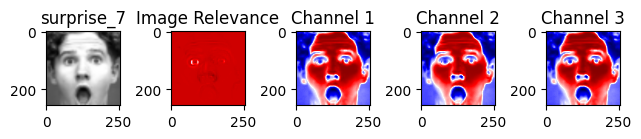

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  4
Contribution of pixels in the range [ 0.2 0.3 ] is :  5
Contribution of pixels in the range [ 0.3 0.4 ] is :  13
Contribution of pixels in the range [ 0.4 0.5 ] is :  29
Contribution of pixels in the range [ 0.5 0.6 ] is :  85
Contribution of pixels in the range [ 0.6 0.7 ] is :  504
Contribution of pixels in the range [ 0.7 0.8 ] is :  193328
Contribution of pixels in the range [ 0.8 0.9 ] is :  1092
Contribution of pixels in the range [ 0.9 1.0 ] is :  12
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


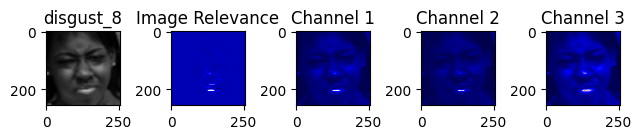

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  82
Contribution of pixels in the range [ 0.1 0.2 ] is :  189624
Contribution of pixels in the range [ 0.2 0.3 ] is :  4921
Contribution of pixels in the range [ 0.3 0.4 ] is :  338
Contribution of pixels in the range [ 0.4 0.5 ] is :  55
Contribution of pixels in the range [ 0.5 0.6 ] is :  18
Contribution of pixels in the range [ 0.6 0.7 ] is :  13
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  9
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


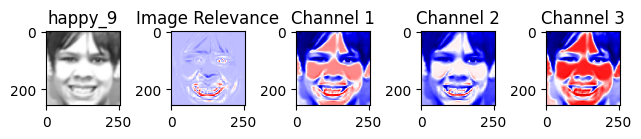

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  42
Contribution of pixels in the range [ 0.3 0.4 ] is :  359
Contribution of pixels in the range [ 0.4 0.5 ] is :  158958
Contribution of pixels in the range [ 0.5 0.6 ] is :  33826
Contribution of pixels in the range [ 0.6 0.7 ] is :  1494
Contribution of pixels in the range [ 0.7 0.8 ] is :  300
Contribution of pixels in the range [ 0.8 0.9 ] is :  68
Contribution of pixels in the range [ 0.9 1.0 ] is :  19
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


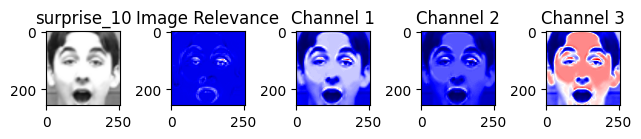

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  16
Contribution of pixels in the range [ 0.1 0.2 ] is :  135
Contribution of pixels in the range [ 0.2 0.3 ] is :  159803
Contribution of pixels in the range [ 0.3 0.4 ] is :  34122
Contribution of pixels in the range [ 0.4 0.5 ] is :  862
Contribution of pixels in the range [ 0.5 0.6 ] is :  97
Contribution of pixels in the range [ 0.6 0.7 ] is :  24
Contribution of pixels in the range [ 0.7 0.8 ] is :  11
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


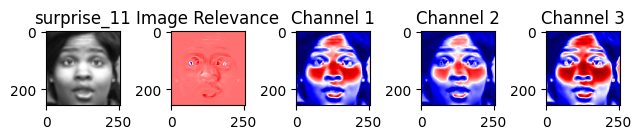

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  9
Contribution of pixels in the range [ 0.2 0.3 ] is :  15
Contribution of pixels in the range [ 0.3 0.4 ] is :  34
Contribution of pixels in the range [ 0.4 0.5 ] is :  93
Contribution of pixels in the range [ 0.5 0.6 ] is :  962
Contribution of pixels in the range [ 0.6 0.7 ] is :  193342
Contribution of pixels in the range [ 0.7 0.8 ] is :  567
Contribution of pixels in the range [ 0.8 0.9 ] is :  42
Contribution of pixels in the range [ 0.9 1.0 ] is :  6
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


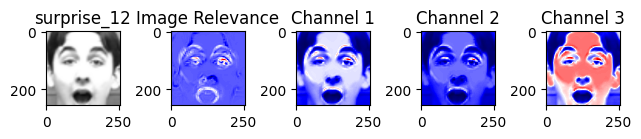

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  10
Contribution of pixels in the range [ 0.1 0.2 ] is :  207
Contribution of pixels in the range [ 0.2 0.3 ] is :  2910
Contribution of pixels in the range [ 0.3 0.4 ] is :  182862
Contribution of pixels in the range [ 0.4 0.5 ] is :  8322
Contribution of pixels in the range [ 0.5 0.6 ] is :  596
Contribution of pixels in the range [ 0.6 0.7 ] is :  116
Contribution of pixels in the range [ 0.7 0.8 ] is :  36
Contribution of pixels in the range [ 0.8 0.9 ] is :  10
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


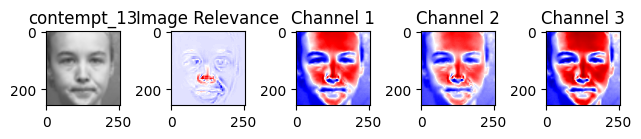

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  5
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  19
Contribution of pixels in the range [ 0.3 0.4 ] is :  93
Contribution of pixels in the range [ 0.4 0.5 ] is :  1778
Contribution of pixels in the range [ 0.5 0.6 ] is :  189319
Contribution of pixels in the range [ 0.6 0.7 ] is :  3401
Contribution of pixels in the range [ 0.7 0.8 ] is :  396
Contribution of pixels in the range [ 0.8 0.9 ] is :  45
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


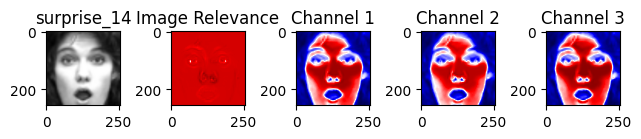

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  3
Contribution of pixels in the range [ 0.3 0.4 ] is :  5
Contribution of pixels in the range [ 0.4 0.5 ] is :  9
Contribution of pixels in the range [ 0.5 0.6 ] is :  24
Contribution of pixels in the range [ 0.6 0.7 ] is :  73
Contribution of pixels in the range [ 0.7 0.8 ] is :  2826
Contribution of pixels in the range [ 0.8 0.9 ] is :  191642
Contribution of pixels in the range [ 0.9 1.0 ] is :  490
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


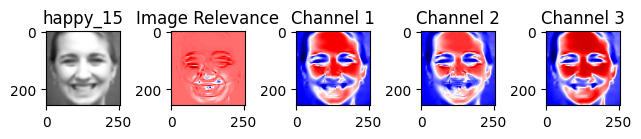

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  16
Contribution of pixels in the range [ 0.2 0.3 ] is :  44
Contribution of pixels in the range [ 0.3 0.4 ] is :  213
Contribution of pixels in the range [ 0.4 0.5 ] is :  1349
Contribution of pixels in the range [ 0.5 0.6 ] is :  20621
Contribution of pixels in the range [ 0.6 0.7 ] is :  170429
Contribution of pixels in the range [ 0.7 0.8 ] is :  2149
Contribution of pixels in the range [ 0.8 0.9 ] is :  232
Contribution of pixels in the range [ 0.9 1.0 ] is :  17
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


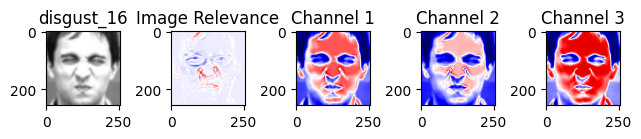

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  4
Contribution of pixels in the range [ 0.2 0.3 ] is :  15
Contribution of pixels in the range [ 0.3 0.4 ] is :  69
Contribution of pixels in the range [ 0.4 0.5 ] is :  938
Contribution of pixels in the range [ 0.5 0.6 ] is :  188987
Contribution of pixels in the range [ 0.6 0.7 ] is :  4812
Contribution of pixels in the range [ 0.7 0.8 ] is :  218
Contribution of pixels in the range [ 0.8 0.9 ] is :  26
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


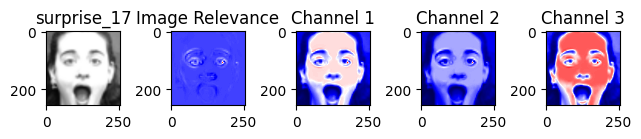

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  9
Contribution of pixels in the range [ 0.2 0.3 ] is :  106
Contribution of pixels in the range [ 0.3 0.4 ] is :  188409
Contribution of pixels in the range [ 0.4 0.5 ] is :  6449
Contribution of pixels in the range [ 0.5 0.6 ] is :  70
Contribution of pixels in the range [ 0.6 0.7 ] is :  14
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


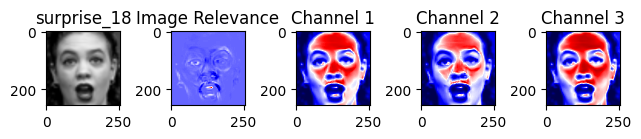

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  9
Contribution of pixels in the range [ 0.1 0.2 ] is :  136
Contribution of pixels in the range [ 0.2 0.3 ] is :  2652
Contribution of pixels in the range [ 0.3 0.4 ] is :  191068
Contribution of pixels in the range [ 0.4 0.5 ] is :  1089
Contribution of pixels in the range [ 0.5 0.6 ] is :  83
Contribution of pixels in the range [ 0.6 0.7 ] is :  17
Contribution of pixels in the range [ 0.7 0.8 ] is :  14
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


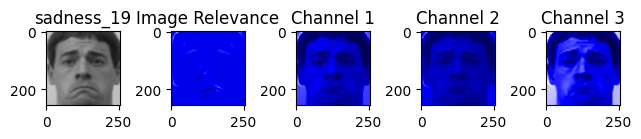

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  47
Contribution of pixels in the range [ 0.1 0.2 ] is :  1170
Contribution of pixels in the range [ 0.2 0.3 ] is :  192156
Contribution of pixels in the range [ 0.3 0.4 ] is :  1458
Contribution of pixels in the range [ 0.4 0.5 ] is :  164
Contribution of pixels in the range [ 0.5 0.6 ] is :  45
Contribution of pixels in the range [ 0.6 0.7 ] is :  22
Contribution of pixels in the range [ 0.7 0.8 ] is :  7
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


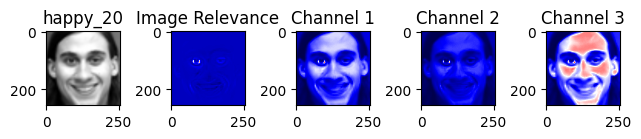

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  101
Contribution of pixels in the range [ 0.1 0.2 ] is :  189342
Contribution of pixels in the range [ 0.2 0.3 ] is :  5385
Contribution of pixels in the range [ 0.3 0.4 ] is :  155
Contribution of pixels in the range [ 0.4 0.5 ] is :  48
Contribution of pixels in the range [ 0.5 0.6 ] is :  18
Contribution of pixels in the range [ 0.6 0.7 ] is :  12
Contribution of pixels in the range [ 0.7 0.8 ] is :  5
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


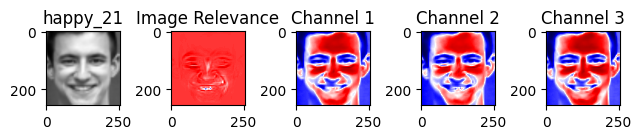

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  10
Contribution of pixels in the range [ 0.3 0.4 ] is :  31
Contribution of pixels in the range [ 0.4 0.5 ] is :  112
Contribution of pixels in the range [ 0.5 0.6 ] is :  695
Contribution of pixels in the range [ 0.6 0.7 ] is :  180745
Contribution of pixels in the range [ 0.7 0.8 ] is :  13210
Contribution of pixels in the range [ 0.8 0.9 ] is :  247
Contribution of pixels in the range [ 0.9 1.0 ] is :  16
High happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


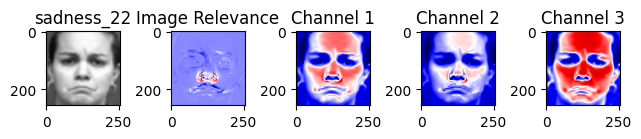

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  10
Contribution of pixels in the range [ 0.1 0.2 ] is :  15
Contribution of pixels in the range [ 0.2 0.3 ] is :  46
Contribution of pixels in the range [ 0.3 0.4 ] is :  798
Contribution of pixels in the range [ 0.4 0.5 ] is :  188947
Contribution of pixels in the range [ 0.5 0.6 ] is :  4539
Contribution of pixels in the range [ 0.6 0.7 ] is :  596
Contribution of pixels in the range [ 0.7 0.8 ] is :  101
Contribution of pixels in the range [ 0.8 0.9 ] is :  20
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


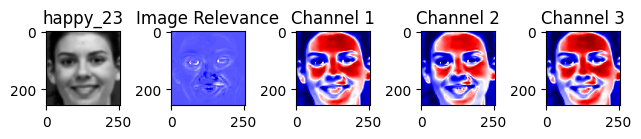

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  5
Contribution of pixels in the range [ 0.1 0.2 ] is :  138
Contribution of pixels in the range [ 0.2 0.3 ] is :  4308
Contribution of pixels in the range [ 0.3 0.4 ] is :  189927
Contribution of pixels in the range [ 0.4 0.5 ] is :  610
Contribution of pixels in the range [ 0.5 0.6 ] is :  58
Contribution of pixels in the range [ 0.6 0.7 ] is :  16
Contribution of pixels in the range [ 0.7 0.8 ] is :  8
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


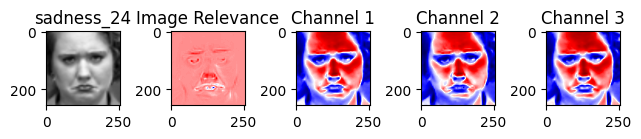

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  7
Contribution of pixels in the range [ 0.3 0.4 ] is :  29
Contribution of pixels in the range [ 0.4 0.5 ] is :  231
Contribution of pixels in the range [ 0.5 0.6 ] is :  7207
Contribution of pixels in the range [ 0.6 0.7 ] is :  187095
Contribution of pixels in the range [ 0.7 0.8 ] is :  486
Contribution of pixels in the range [ 0.8 0.9 ] is :  12
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


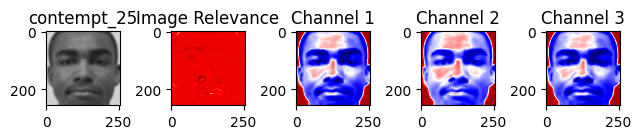

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  8
Contribution of pixels in the range [ 0.3 0.4 ] is :  10
Contribution of pixels in the range [ 0.4 0.5 ] is :  38
Contribution of pixels in the range [ 0.5 0.6 ] is :  122
Contribution of pixels in the range [ 0.6 0.7 ] is :  1014
Contribution of pixels in the range [ 0.7 0.8 ] is :  191353
Contribution of pixels in the range [ 0.8 0.9 ] is :  2473
Contribution of pixels in the range [ 0.9 1.0 ] is :  53
High contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


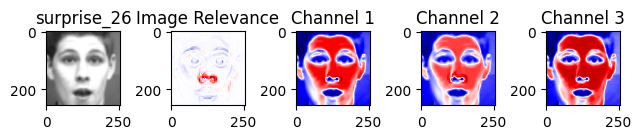

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  4
Contribution of pixels in the range [ 0.3 0.4 ] is :  18
Contribution of pixels in the range [ 0.4 0.5 ] is :  74
Contribution of pixels in the range [ 0.5 0.6 ] is :  6460
Contribution of pixels in the range [ 0.6 0.7 ] is :  186573
Contribution of pixels in the range [ 0.7 0.8 ] is :  1651
Contribution of pixels in the range [ 0.8 0.9 ] is :  264
Contribution of pixels in the range [ 0.9 1.0 ] is :  23
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


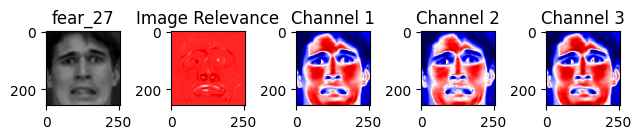

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  2
Contribution of pixels in the range [ 0.3 0.4 ] is :  4
Contribution of pixels in the range [ 0.4 0.5 ] is :  37
Contribution of pixels in the range [ 0.5 0.6 ] is :  193
Contribution of pixels in the range [ 0.6 0.7 ] is :  2622
Contribution of pixels in the range [ 0.7 0.8 ] is :  191343
Contribution of pixels in the range [ 0.8 0.9 ] is :  820
Contribution of pixels in the range [ 0.9 1.0 ] is :  51
High fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


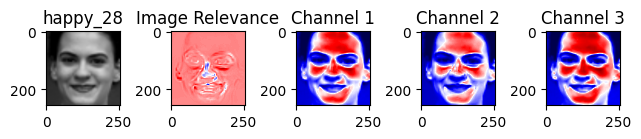

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  9
Contribution of pixels in the range [ 0.3 0.4 ] is :  79
Contribution of pixels in the range [ 0.4 0.5 ] is :  783
Contribution of pixels in the range [ 0.5 0.6 ] is :  9562
Contribution of pixels in the range [ 0.6 0.7 ] is :  183170
Contribution of pixels in the range [ 0.7 0.8 ] is :  1324
Contribution of pixels in the range [ 0.8 0.9 ] is :  126
Contribution of pixels in the range [ 0.9 1.0 ] is :  12
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


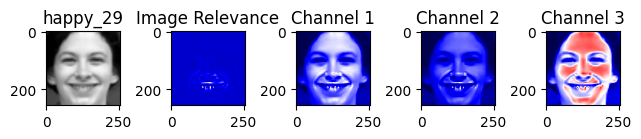

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  42
Contribution of pixels in the range [ 0.1 0.2 ] is :  592
Contribution of pixels in the range [ 0.2 0.3 ] is :  191478
Contribution of pixels in the range [ 0.3 0.4 ] is :  2606
Contribution of pixels in the range [ 0.4 0.5 ] is :  245
Contribution of pixels in the range [ 0.5 0.6 ] is :  71
Contribution of pixels in the range [ 0.6 0.7 ] is :  29
Contribution of pixels in the range [ 0.7 0.8 ] is :  3
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  6
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


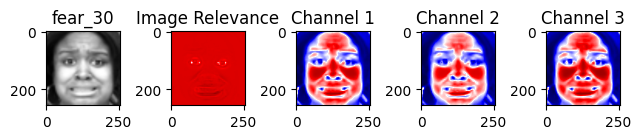

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  2
Contribution of pixels in the range [ 0.3 0.4 ] is :  9
Contribution of pixels in the range [ 0.4 0.5 ] is :  17
Contribution of pixels in the range [ 0.5 0.6 ] is :  39
Contribution of pixels in the range [ 0.6 0.7 ] is :  189
Contribution of pixels in the range [ 0.7 0.8 ] is :  20644
Contribution of pixels in the range [ 0.8 0.9 ] is :  174044
Contribution of pixels in the range [ 0.9 1.0 ] is :  127
High fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


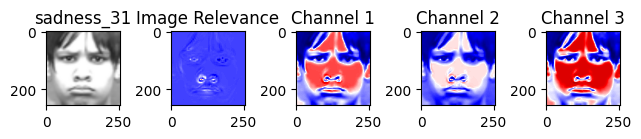

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  8
Contribution of pixels in the range [ 0.1 0.2 ] is :  40
Contribution of pixels in the range [ 0.2 0.3 ] is :  263
Contribution of pixels in the range [ 0.3 0.4 ] is :  191764
Contribution of pixels in the range [ 0.4 0.5 ] is :  2839
Contribution of pixels in the range [ 0.5 0.6 ] is :  135
Contribution of pixels in the range [ 0.6 0.7 ] is :  17
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


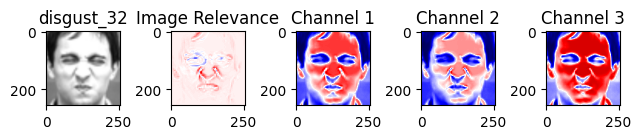

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  8
Contribution of pixels in the range [ 0.3 0.4 ] is :  43
Contribution of pixels in the range [ 0.4 0.5 ] is :  280
Contribution of pixels in the range [ 0.5 0.6 ] is :  162221
Contribution of pixels in the range [ 0.6 0.7 ] is :  31974
Contribution of pixels in the range [ 0.7 0.8 ] is :  504
Contribution of pixels in the range [ 0.8 0.9 ] is :  34
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


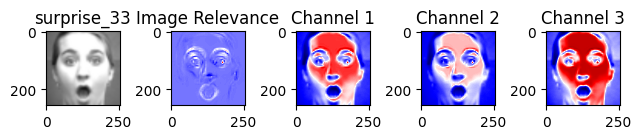

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  9
Contribution of pixels in the range [ 0.2 0.3 ] is :  54
Contribution of pixels in the range [ 0.3 0.4 ] is :  1694
Contribution of pixels in the range [ 0.4 0.5 ] is :  191013
Contribution of pixels in the range [ 0.5 0.6 ] is :  2204
Contribution of pixels in the range [ 0.6 0.7 ] is :  79
Contribution of pixels in the range [ 0.7 0.8 ] is :  14
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


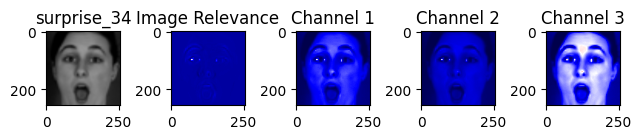

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  109
Contribution of pixels in the range [ 0.1 0.2 ] is :  194444
Contribution of pixels in the range [ 0.2 0.3 ] is :  438
Contribution of pixels in the range [ 0.3 0.4 ] is :  52
Contribution of pixels in the range [ 0.4 0.5 ] is :  20
Contribution of pixels in the range [ 0.5 0.6 ] is :  4
Contribution of pixels in the range [ 0.6 0.7 ] is :  4
Contribution of pixels in the range [ 0.7 0.8 ] is :  1
Contribution of pixels in the range [ 0.8 0.9 ] is :  1
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


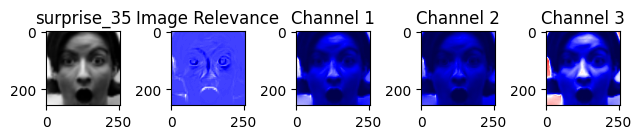

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  12
Contribution of pixels in the range [ 0.1 0.2 ] is :  202
Contribution of pixels in the range [ 0.2 0.3 ] is :  2430
Contribution of pixels in the range [ 0.3 0.4 ] is :  189726
Contribution of pixels in the range [ 0.4 0.5 ] is :  2369
Contribution of pixels in the range [ 0.5 0.6 ] is :  282
Contribution of pixels in the range [ 0.6 0.7 ] is :  38
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


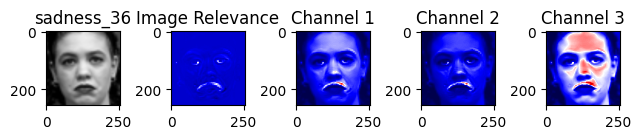

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  116
Contribution of pixels in the range [ 0.1 0.2 ] is :  21040
Contribution of pixels in the range [ 0.2 0.3 ] is :  172380
Contribution of pixels in the range [ 0.3 0.4 ] is :  1221
Contribution of pixels in the range [ 0.4 0.5 ] is :  241
Contribution of pixels in the range [ 0.5 0.6 ] is :  54
Contribution of pixels in the range [ 0.6 0.7 ] is :  13
Contribution of pixels in the range [ 0.7 0.8 ] is :  3
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


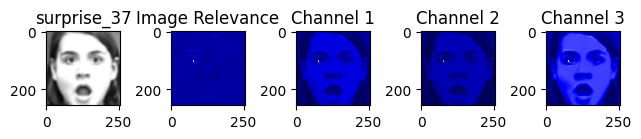

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1589
Contribution of pixels in the range [ 0.1 0.2 ] is :  193264
Contribution of pixels in the range [ 0.2 0.3 ] is :  175
Contribution of pixels in the range [ 0.3 0.4 ] is :  24
Contribution of pixels in the range [ 0.4 0.5 ] is :  8
Contribution of pixels in the range [ 0.5 0.6 ] is :  6
Contribution of pixels in the range [ 0.6 0.7 ] is :  2
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


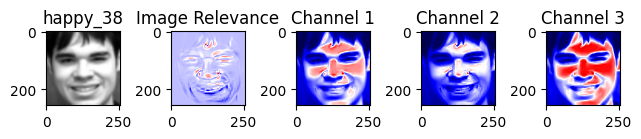

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  17
Contribution of pixels in the range [ 0.1 0.2 ] is :  71
Contribution of pixels in the range [ 0.2 0.3 ] is :  289
Contribution of pixels in the range [ 0.3 0.4 ] is :  2456
Contribution of pixels in the range [ 0.4 0.5 ] is :  178019
Contribution of pixels in the range [ 0.5 0.6 ] is :  13328
Contribution of pixels in the range [ 0.6 0.7 ] is :  790
Contribution of pixels in the range [ 0.7 0.8 ] is :  88
Contribution of pixels in the range [ 0.8 0.9 ] is :  12
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


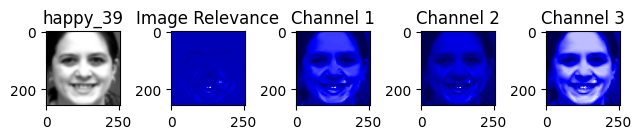

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  119
Contribution of pixels in the range [ 0.1 0.2 ] is :  185078
Contribution of pixels in the range [ 0.2 0.3 ] is :  9690
Contribution of pixels in the range [ 0.3 0.4 ] is :  151
Contribution of pixels in the range [ 0.4 0.5 ] is :  20
Contribution of pixels in the range [ 0.5 0.6 ] is :  9
Contribution of pixels in the range [ 0.6 0.7 ] is :  2
Contribution of pixels in the range [ 0.7 0.8 ] is :  2
Contribution of pixels in the range [ 0.8 0.9 ] is :  1
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


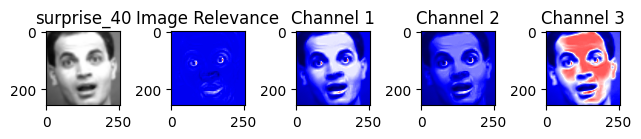

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  33
Contribution of pixels in the range [ 0.1 0.2 ] is :  784
Contribution of pixels in the range [ 0.2 0.3 ] is :  187758
Contribution of pixels in the range [ 0.3 0.4 ] is :  5877
Contribution of pixels in the range [ 0.4 0.5 ] is :  465
Contribution of pixels in the range [ 0.5 0.6 ] is :  87
Contribution of pixels in the range [ 0.6 0.7 ] is :  40
Contribution of pixels in the range [ 0.7 0.8 ] is :  15
Contribution of pixels in the range [ 0.8 0.9 ] is :  10
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


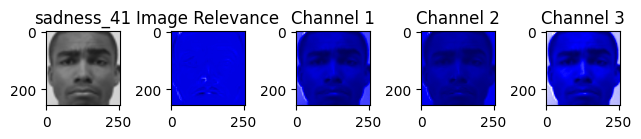

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  42
Contribution of pixels in the range [ 0.1 0.2 ] is :  2534
Contribution of pixels in the range [ 0.2 0.3 ] is :  191666
Contribution of pixels in the range [ 0.3 0.4 ] is :  679
Contribution of pixels in the range [ 0.4 0.5 ] is :  90
Contribution of pixels in the range [ 0.5 0.6 ] is :  30
Contribution of pixels in the range [ 0.6 0.7 ] is :  18
Contribution of pixels in the range [ 0.7 0.8 ] is :  8
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


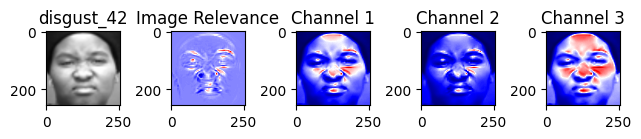

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  13
Contribution of pixels in the range [ 0.1 0.2 ] is :  69
Contribution of pixels in the range [ 0.2 0.3 ] is :  918
Contribution of pixels in the range [ 0.3 0.4 ] is :  167089
Contribution of pixels in the range [ 0.4 0.5 ] is :  24610
Contribution of pixels in the range [ 0.5 0.6 ] is :  2021
Contribution of pixels in the range [ 0.6 0.7 ] is :  283
Contribution of pixels in the range [ 0.7 0.8 ] is :  61
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


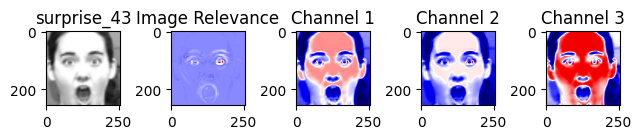

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  6
Contribution of pixels in the range [ 0.3 0.4 ] is :  54
Contribution of pixels in the range [ 0.4 0.5 ] is :  189893
Contribution of pixels in the range [ 0.5 0.6 ] is :  4929
Contribution of pixels in the range [ 0.6 0.7 ] is :  147
Contribution of pixels in the range [ 0.7 0.8 ] is :  24
Contribution of pixels in the range [ 0.8 0.9 ] is :  11
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


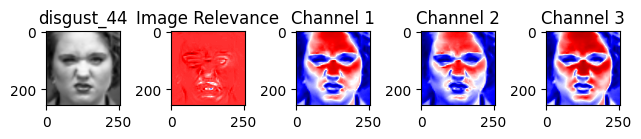

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  5
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  15
Contribution of pixels in the range [ 0.3 0.4 ] is :  39
Contribution of pixels in the range [ 0.4 0.5 ] is :  133
Contribution of pixels in the range [ 0.5 0.6 ] is :  995
Contribution of pixels in the range [ 0.6 0.7 ] is :  153800
Contribution of pixels in the range [ 0.7 0.8 ] is :  39479
Contribution of pixels in the range [ 0.8 0.9 ] is :  578
Contribution of pixels in the range [ 0.9 1.0 ] is :  28
High disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


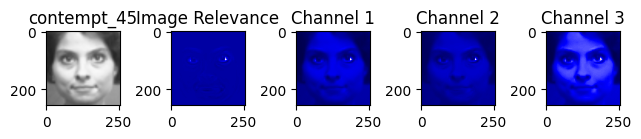

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  20
Contribution of pixels in the range [ 0.1 0.2 ] is :  193599
Contribution of pixels in the range [ 0.2 0.3 ] is :  1316
Contribution of pixels in the range [ 0.3 0.4 ] is :  93
Contribution of pixels in the range [ 0.4 0.5 ] is :  26
Contribution of pixels in the range [ 0.5 0.6 ] is :  8
Contribution of pixels in the range [ 0.6 0.7 ] is :  5
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  1
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


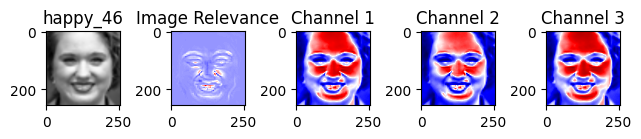

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  6
Contribution of pixels in the range [ 0.2 0.3 ] is :  51
Contribution of pixels in the range [ 0.3 0.4 ] is :  251
Contribution of pixels in the range [ 0.4 0.5 ] is :  170063
Contribution of pixels in the range [ 0.5 0.6 ] is :  23780
Contribution of pixels in the range [ 0.6 0.7 ] is :  831
Contribution of pixels in the range [ 0.7 0.8 ] is :  77
Contribution of pixels in the range [ 0.8 0.9 ] is :  10
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


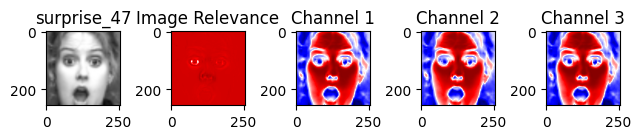

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  0
Contribution of pixels in the range [ 0.2 0.3 ] is :  7
Contribution of pixels in the range [ 0.3 0.4 ] is :  14
Contribution of pixels in the range [ 0.4 0.5 ] is :  24
Contribution of pixels in the range [ 0.5 0.6 ] is :  36
Contribution of pixels in the range [ 0.6 0.7 ] is :  312
Contribution of pixels in the range [ 0.7 0.8 ] is :  179610
Contribution of pixels in the range [ 0.8 0.9 ] is :  15034
Contribution of pixels in the range [ 0.9 1.0 ] is :  36
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


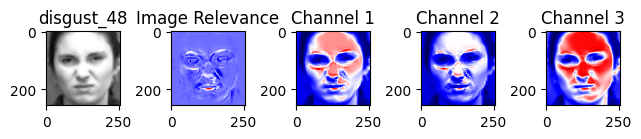

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  23
Contribution of pixels in the range [ 0.1 0.2 ] is :  115
Contribution of pixels in the range [ 0.2 0.3 ] is :  1329
Contribution of pixels in the range [ 0.3 0.4 ] is :  171898
Contribution of pixels in the range [ 0.4 0.5 ] is :  20501
Contribution of pixels in the range [ 0.5 0.6 ] is :  975
Contribution of pixels in the range [ 0.6 0.7 ] is :  146
Contribution of pixels in the range [ 0.7 0.8 ] is :  61
Contribution of pixels in the range [ 0.8 0.9 ] is :  12
Contribution of pixels in the range [ 0.9 1.0 ] is :  14
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


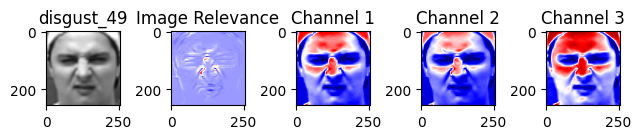

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  20
Contribution of pixels in the range [ 0.3 0.4 ] is :  173
Contribution of pixels in the range [ 0.4 0.5 ] is :  5593
Contribution of pixels in the range [ 0.5 0.6 ] is :  187910
Contribution of pixels in the range [ 0.6 0.7 ] is :  1236
Contribution of pixels in the range [ 0.7 0.8 ] is :  104
Contribution of pixels in the range [ 0.8 0.9 ] is :  24
Contribution of pixels in the range [ 0.9 1.0 ] is :  9
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


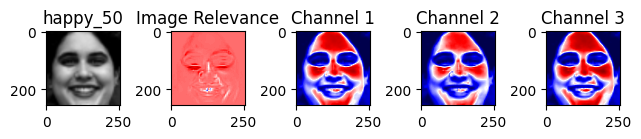

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  4
Contribution of pixels in the range [ 0.3 0.4 ] is :  25
Contribution of pixels in the range [ 0.4 0.5 ] is :  105
Contribution of pixels in the range [ 0.5 0.6 ] is :  643
Contribution of pixels in the range [ 0.6 0.7 ] is :  164775
Contribution of pixels in the range [ 0.7 0.8 ] is :  28713
Contribution of pixels in the range [ 0.8 0.9 ] is :  708
Contribution of pixels in the range [ 0.9 1.0 ] is :  98
High happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


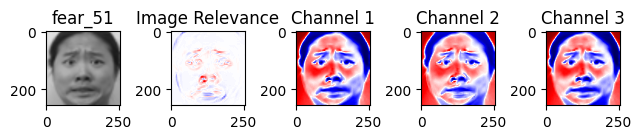

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  10
Contribution of pixels in the range [ 0.2 0.3 ] is :  35
Contribution of pixels in the range [ 0.3 0.4 ] is :  407
Contribution of pixels in the range [ 0.4 0.5 ] is :  145762
Contribution of pixels in the range [ 0.5 0.6 ] is :  48041
Contribution of pixels in the range [ 0.6 0.7 ] is :  708
Contribution of pixels in the range [ 0.7 0.8 ] is :  96
Contribution of pixels in the range [ 0.8 0.9 ] is :  9
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


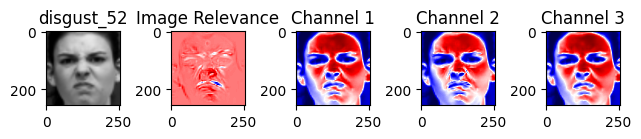

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  7
Contribution of pixels in the range [ 0.1 0.2 ] is :  19
Contribution of pixels in the range [ 0.2 0.3 ] is :  99
Contribution of pixels in the range [ 0.3 0.4 ] is :  472
Contribution of pixels in the range [ 0.4 0.5 ] is :  3480
Contribution of pixels in the range [ 0.5 0.6 ] is :  186045
Contribution of pixels in the range [ 0.6 0.7 ] is :  4583
Contribution of pixels in the range [ 0.7 0.8 ] is :  331
Contribution of pixels in the range [ 0.8 0.9 ] is :  28
Contribution of pixels in the range [ 0.9 1.0 ] is :  10
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


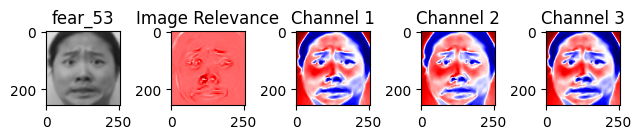

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  11
Contribution of pixels in the range [ 0.3 0.4 ] is :  39
Contribution of pixels in the range [ 0.4 0.5 ] is :  176
Contribution of pixels in the range [ 0.5 0.6 ] is :  4622
Contribution of pixels in the range [ 0.6 0.7 ] is :  188500
Contribution of pixels in the range [ 0.7 0.8 ] is :  1575
Contribution of pixels in the range [ 0.8 0.9 ] is :  132
Contribution of pixels in the range [ 0.9 1.0 ] is :  15
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


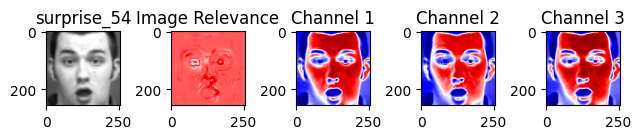

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  10
Contribution of pixels in the range [ 0.2 0.3 ] is :  22
Contribution of pixels in the range [ 0.3 0.4 ] is :  52
Contribution of pixels in the range [ 0.4 0.5 ] is :  175
Contribution of pixels in the range [ 0.5 0.6 ] is :  1335
Contribution of pixels in the range [ 0.6 0.7 ] is :  186467
Contribution of pixels in the range [ 0.7 0.8 ] is :  6701
Contribution of pixels in the range [ 0.8 0.9 ] is :  290
Contribution of pixels in the range [ 0.9 1.0 ] is :  20
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


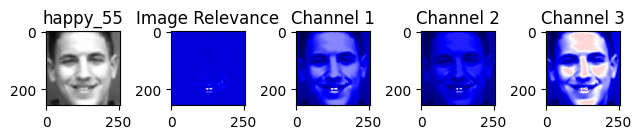

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  16
Contribution of pixels in the range [ 0.1 0.2 ] is :  195
Contribution of pixels in the range [ 0.2 0.3 ] is :  193668
Contribution of pixels in the range [ 0.3 0.4 ] is :  1027
Contribution of pixels in the range [ 0.4 0.5 ] is :  118
Contribution of pixels in the range [ 0.5 0.6 ] is :  30
Contribution of pixels in the range [ 0.6 0.7 ] is :  11
Contribution of pixels in the range [ 0.7 0.8 ] is :  7
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


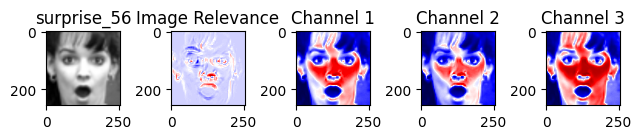

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  9
Contribution of pixels in the range [ 0.3 0.4 ] is :  22
Contribution of pixels in the range [ 0.4 0.5 ] is :  368
Contribution of pixels in the range [ 0.5 0.6 ] is :  155666
Contribution of pixels in the range [ 0.6 0.7 ] is :  37756
Contribution of pixels in the range [ 0.7 0.8 ] is :  1054
Contribution of pixels in the range [ 0.8 0.9 ] is :  169
Contribution of pixels in the range [ 0.9 1.0 ] is :  27
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


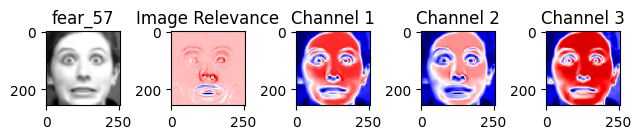

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  19
Contribution of pixels in the range [ 0.1 0.2 ] is :  12
Contribution of pixels in the range [ 0.2 0.3 ] is :  78
Contribution of pixels in the range [ 0.3 0.4 ] is :  238
Contribution of pixels in the range [ 0.4 0.5 ] is :  1445
Contribution of pixels in the range [ 0.5 0.6 ] is :  162965
Contribution of pixels in the range [ 0.6 0.7 ] is :  29340
Contribution of pixels in the range [ 0.7 0.8 ] is :  895
Contribution of pixels in the range [ 0.8 0.9 ] is :  77
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


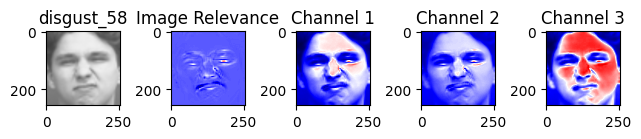

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  18
Contribution of pixels in the range [ 0.1 0.2 ] is :  137
Contribution of pixels in the range [ 0.2 0.3 ] is :  1242
Contribution of pixels in the range [ 0.3 0.4 ] is :  187451
Contribution of pixels in the range [ 0.4 0.5 ] is :  5924
Contribution of pixels in the range [ 0.5 0.6 ] is :  237
Contribution of pixels in the range [ 0.6 0.7 ] is :  32
Contribution of pixels in the range [ 0.7 0.8 ] is :  22
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


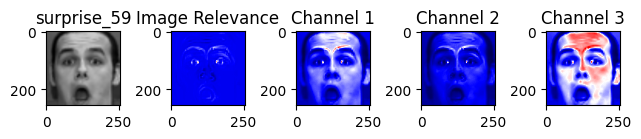

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  66
Contribution of pixels in the range [ 0.1 0.2 ] is :  8387
Contribution of pixels in the range [ 0.2 0.3 ] is :  185560
Contribution of pixels in the range [ 0.3 0.4 ] is :  904
Contribution of pixels in the range [ 0.4 0.5 ] is :  102
Contribution of pixels in the range [ 0.5 0.6 ] is :  28
Contribution of pixels in the range [ 0.6 0.7 ] is :  13
Contribution of pixels in the range [ 0.7 0.8 ] is :  2
Contribution of pixels in the range [ 0.8 0.9 ] is :  9
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


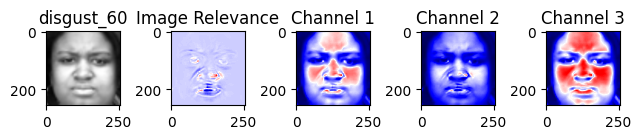

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  16
Contribution of pixels in the range [ 0.1 0.2 ] is :  95
Contribution of pixels in the range [ 0.2 0.3 ] is :  346
Contribution of pixels in the range [ 0.3 0.4 ] is :  4406
Contribution of pixels in the range [ 0.4 0.5 ] is :  188846
Contribution of pixels in the range [ 0.5 0.6 ] is :  1217
Contribution of pixels in the range [ 0.6 0.7 ] is :  100
Contribution of pixels in the range [ 0.7 0.8 ] is :  40
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


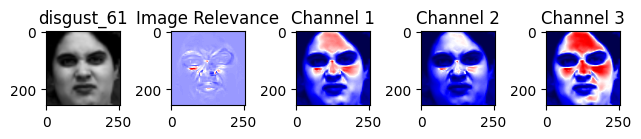

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  41
Contribution of pixels in the range [ 0.3 0.4 ] is :  269
Contribution of pixels in the range [ 0.4 0.5 ] is :  185597
Contribution of pixels in the range [ 0.5 0.6 ] is :  8573
Contribution of pixels in the range [ 0.6 0.7 ] is :  457
Contribution of pixels in the range [ 0.7 0.8 ] is :  98
Contribution of pixels in the range [ 0.8 0.9 ] is :  24
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


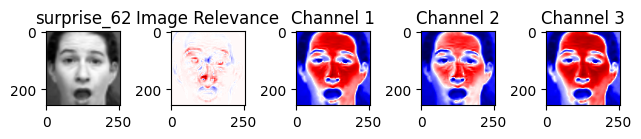

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  4
Contribution of pixels in the range [ 0.3 0.4 ] is :  47
Contribution of pixels in the range [ 0.4 0.5 ] is :  550
Contribution of pixels in the range [ 0.5 0.6 ] is :  180403
Contribution of pixels in the range [ 0.6 0.7 ] is :  13357
Contribution of pixels in the range [ 0.7 0.8 ] is :  568
Contribution of pixels in the range [ 0.8 0.9 ] is :  105
Contribution of pixels in the range [ 0.9 1.0 ] is :  35
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


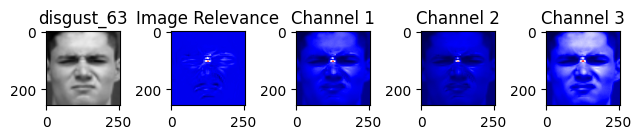

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  158
Contribution of pixels in the range [ 0.1 0.2 ] is :  3854
Contribution of pixels in the range [ 0.2 0.3 ] is :  189595
Contribution of pixels in the range [ 0.3 0.4 ] is :  1203
Contribution of pixels in the range [ 0.4 0.5 ] is :  155
Contribution of pixels in the range [ 0.5 0.6 ] is :  63
Contribution of pixels in the range [ 0.6 0.7 ] is :  26
Contribution of pixels in the range [ 0.7 0.8 ] is :  9
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


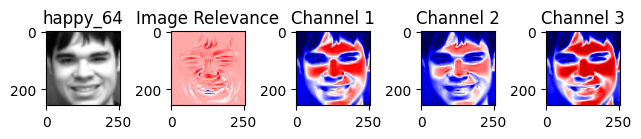

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  32
Contribution of pixels in the range [ 0.3 0.4 ] is :  107
Contribution of pixels in the range [ 0.4 0.5 ] is :  583
Contribution of pixels in the range [ 0.5 0.6 ] is :  20143
Contribution of pixels in the range [ 0.6 0.7 ] is :  172480
Contribution of pixels in the range [ 0.7 0.8 ] is :  1620
Contribution of pixels in the range [ 0.8 0.9 ] is :  93
Contribution of pixels in the range [ 0.9 1.0 ] is :  10
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


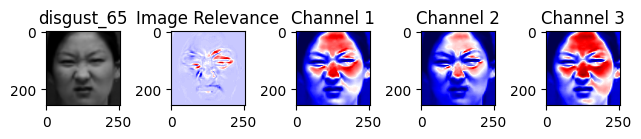

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  9
Contribution of pixels in the range [ 0.1 0.2 ] is :  15
Contribution of pixels in the range [ 0.2 0.3 ] is :  52
Contribution of pixels in the range [ 0.3 0.4 ] is :  268
Contribution of pixels in the range [ 0.4 0.5 ] is :  5001
Contribution of pixels in the range [ 0.5 0.6 ] is :  185663
Contribution of pixels in the range [ 0.6 0.7 ] is :  3165
Contribution of pixels in the range [ 0.7 0.8 ] is :  686
Contribution of pixels in the range [ 0.8 0.9 ] is :  168
Contribution of pixels in the range [ 0.9 1.0 ] is :  47
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


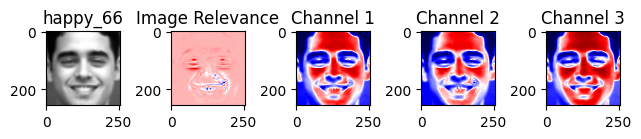

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  20
Contribution of pixels in the range [ 0.2 0.3 ] is :  139
Contribution of pixels in the range [ 0.3 0.4 ] is :  1103
Contribution of pixels in the range [ 0.4 0.5 ] is :  180738
Contribution of pixels in the range [ 0.5 0.6 ] is :  12665
Contribution of pixels in the range [ 0.6 0.7 ] is :  360
Contribution of pixels in the range [ 0.7 0.8 ] is :  40
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


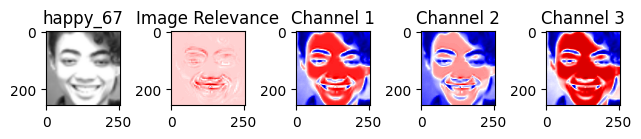

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  5
Contribution of pixels in the range [ 0.3 0.4 ] is :  18
Contribution of pixels in the range [ 0.4 0.5 ] is :  295
Contribution of pixels in the range [ 0.5 0.6 ] is :  183072
Contribution of pixels in the range [ 0.6 0.7 ] is :  11144
Contribution of pixels in the range [ 0.7 0.8 ] is :  443
Contribution of pixels in the range [ 0.8 0.9 ] is :  70
Contribution of pixels in the range [ 0.9 1.0 ] is :  24
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


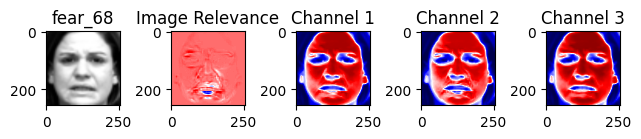

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  13
Contribution of pixels in the range [ 0.1 0.2 ] is :  27
Contribution of pixels in the range [ 0.2 0.3 ] is :  91
Contribution of pixels in the range [ 0.3 0.4 ] is :  196
Contribution of pixels in the range [ 0.4 0.5 ] is :  501
Contribution of pixels in the range [ 0.5 0.6 ] is :  2417
Contribution of pixels in the range [ 0.6 0.7 ] is :  181540
Contribution of pixels in the range [ 0.7 0.8 ] is :  9954
Contribution of pixels in the range [ 0.8 0.9 ] is :  259
Contribution of pixels in the range [ 0.9 1.0 ] is :  76
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


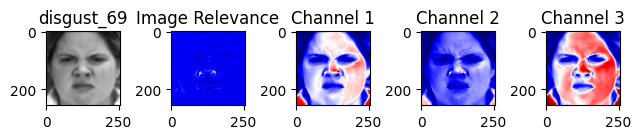

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  17
Contribution of pixels in the range [ 0.1 0.2 ] is :  87
Contribution of pixels in the range [ 0.2 0.3 ] is :  164495
Contribution of pixels in the range [ 0.3 0.4 ] is :  30227
Contribution of pixels in the range [ 0.4 0.5 ] is :  182
Contribution of pixels in the range [ 0.5 0.6 ] is :  39
Contribution of pixels in the range [ 0.6 0.7 ] is :  15
Contribution of pixels in the range [ 0.7 0.8 ] is :  6
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


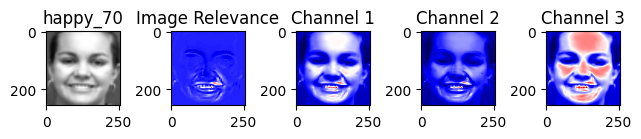

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  10
Contribution of pixels in the range [ 0.1 0.2 ] is :  54
Contribution of pixels in the range [ 0.2 0.3 ] is :  879
Contribution of pixels in the range [ 0.3 0.4 ] is :  183955
Contribution of pixels in the range [ 0.4 0.5 ] is :  9141
Contribution of pixels in the range [ 0.5 0.6 ] is :  804
Contribution of pixels in the range [ 0.6 0.7 ] is :  188
Contribution of pixels in the range [ 0.7 0.8 ] is :  34
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


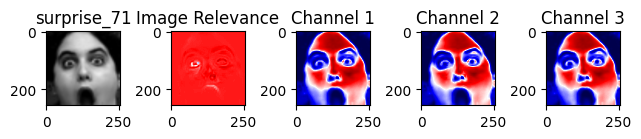

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  7
Contribution of pixels in the range [ 0.3 0.4 ] is :  20
Contribution of pixels in the range [ 0.4 0.5 ] is :  38
Contribution of pixels in the range [ 0.5 0.6 ] is :  171
Contribution of pixels in the range [ 0.6 0.7 ] is :  2065
Contribution of pixels in the range [ 0.7 0.8 ] is :  192208
Contribution of pixels in the range [ 0.8 0.9 ] is :  537
Contribution of pixels in the range [ 0.9 1.0 ] is :  24
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


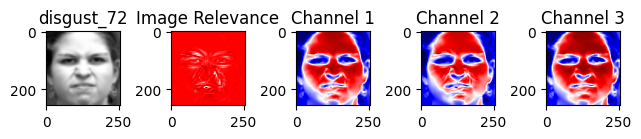

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  8
Contribution of pixels in the range [ 0.2 0.3 ] is :  12
Contribution of pixels in the range [ 0.3 0.4 ] is :  24
Contribution of pixels in the range [ 0.4 0.5 ] is :  145
Contribution of pixels in the range [ 0.5 0.6 ] is :  1297
Contribution of pixels in the range [ 0.6 0.7 ] is :  38898
Contribution of pixels in the range [ 0.7 0.8 ] is :  154290
Contribution of pixels in the range [ 0.8 0.9 ] is :  370
Contribution of pixels in the range [ 0.9 1.0 ] is :  24
High disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


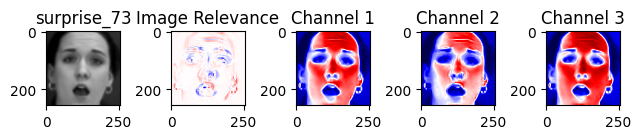

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  11
Contribution of pixels in the range [ 0.2 0.3 ] is :  72
Contribution of pixels in the range [ 0.3 0.4 ] is :  882
Contribution of pixels in the range [ 0.4 0.5 ] is :  154019
Contribution of pixels in the range [ 0.5 0.6 ] is :  39482
Contribution of pixels in the range [ 0.6 0.7 ] is :  527
Contribution of pixels in the range [ 0.7 0.8 ] is :  65
Contribution of pixels in the range [ 0.8 0.9 ] is :  9
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


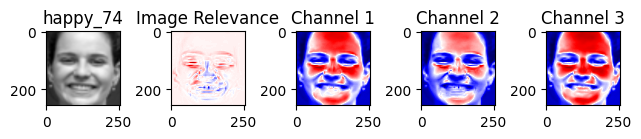

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  5
Contribution of pixels in the range [ 0.2 0.3 ] is :  76
Contribution of pixels in the range [ 0.3 0.4 ] is :  582
Contribution of pixels in the range [ 0.4 0.5 ] is :  13014
Contribution of pixels in the range [ 0.5 0.6 ] is :  178944
Contribution of pixels in the range [ 0.6 0.7 ] is :  2141
Contribution of pixels in the range [ 0.7 0.8 ] is :  226
Contribution of pixels in the range [ 0.8 0.9 ] is :  58
Contribution of pixels in the range [ 0.9 1.0 ] is :  24
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


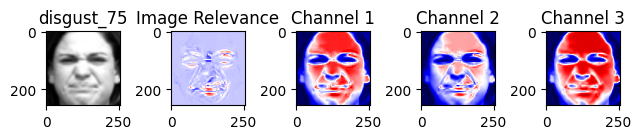

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  15
Contribution of pixels in the range [ 0.1 0.2 ] is :  14
Contribution of pixels in the range [ 0.2 0.3 ] is :  82
Contribution of pixels in the range [ 0.3 0.4 ] is :  490
Contribution of pixels in the range [ 0.4 0.5 ] is :  127089
Contribution of pixels in the range [ 0.5 0.6 ] is :  65685
Contribution of pixels in the range [ 0.6 0.7 ] is :  1520
Contribution of pixels in the range [ 0.7 0.8 ] is :  159
Contribution of pixels in the range [ 0.8 0.9 ] is :  18
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


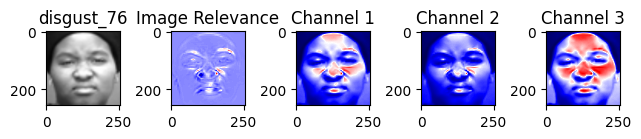

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  21
Contribution of pixels in the range [ 0.2 0.3 ] is :  122
Contribution of pixels in the range [ 0.3 0.4 ] is :  1414
Contribution of pixels in the range [ 0.4 0.5 ] is :  186447
Contribution of pixels in the range [ 0.5 0.6 ] is :  6553
Contribution of pixels in the range [ 0.6 0.7 ] is :  462
Contribution of pixels in the range [ 0.7 0.8 ] is :  46
Contribution of pixels in the range [ 0.8 0.9 ] is :  5
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


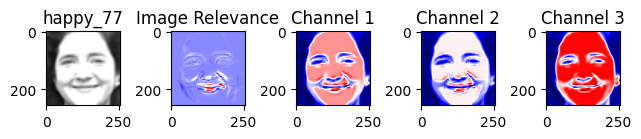

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  22
Contribution of pixels in the range [ 0.1 0.2 ] is :  22
Contribution of pixels in the range [ 0.2 0.3 ] is :  91
Contribution of pixels in the range [ 0.3 0.4 ] is :  383
Contribution of pixels in the range [ 0.4 0.5 ] is :  159427
Contribution of pixels in the range [ 0.5 0.6 ] is :  33010
Contribution of pixels in the range [ 0.6 0.7 ] is :  1633
Contribution of pixels in the range [ 0.7 0.8 ] is :  393
Contribution of pixels in the range [ 0.8 0.9 ] is :  71
Contribution of pixels in the range [ 0.9 1.0 ] is :  22
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


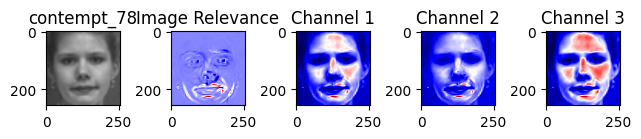

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  9
Contribution of pixels in the range [ 0.1 0.2 ] is :  26
Contribution of pixels in the range [ 0.2 0.3 ] is :  185
Contribution of pixels in the range [ 0.3 0.4 ] is :  2242
Contribution of pixels in the range [ 0.4 0.5 ] is :  184979
Contribution of pixels in the range [ 0.5 0.6 ] is :  6688
Contribution of pixels in the range [ 0.6 0.7 ] is :  696
Contribution of pixels in the range [ 0.7 0.8 ] is :  194
Contribution of pixels in the range [ 0.8 0.9 ] is :  36
Contribution of pixels in the range [ 0.9 1.0 ] is :  19
Medium contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


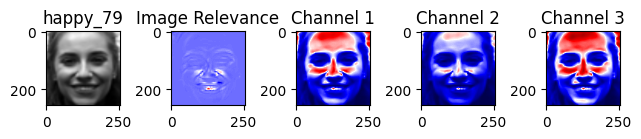

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  31
Contribution of pixels in the range [ 0.2 0.3 ] is :  483
Contribution of pixels in the range [ 0.3 0.4 ] is :  191408
Contribution of pixels in the range [ 0.4 0.5 ] is :  2900
Contribution of pixels in the range [ 0.5 0.6 ] is :  201
Contribution of pixels in the range [ 0.6 0.7 ] is :  33
Contribution of pixels in the range [ 0.7 0.8 ] is :  7
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


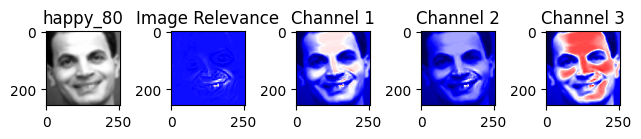

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  10
Contribution of pixels in the range [ 0.1 0.2 ] is :  58
Contribution of pixels in the range [ 0.2 0.3 ] is :  414
Contribution of pixels in the range [ 0.3 0.4 ] is :  191799
Contribution of pixels in the range [ 0.4 0.5 ] is :  2544
Contribution of pixels in the range [ 0.5 0.6 ] is :  198
Contribution of pixels in the range [ 0.6 0.7 ] is :  37
Contribution of pixels in the range [ 0.7 0.8 ] is :  9
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


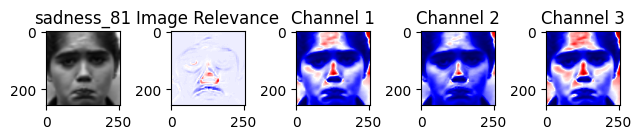

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  19
Contribution of pixels in the range [ 0.3 0.4 ] is :  177
Contribution of pixels in the range [ 0.4 0.5 ] is :  3719
Contribution of pixels in the range [ 0.5 0.6 ] is :  189839
Contribution of pixels in the range [ 0.6 0.7 ] is :  1216
Contribution of pixels in the range [ 0.7 0.8 ] is :  76
Contribution of pixels in the range [ 0.8 0.9 ] is :  15
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


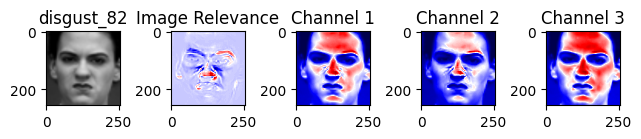

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  27
Contribution of pixels in the range [ 0.2 0.3 ] is :  259
Contribution of pixels in the range [ 0.3 0.4 ] is :  2252
Contribution of pixels in the range [ 0.4 0.5 ] is :  182032
Contribution of pixels in the range [ 0.5 0.6 ] is :  9239
Contribution of pixels in the range [ 0.6 0.7 ] is :  1052
Contribution of pixels in the range [ 0.7 0.8 ] is :  194
Contribution of pixels in the range [ 0.8 0.9 ] is :  13
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


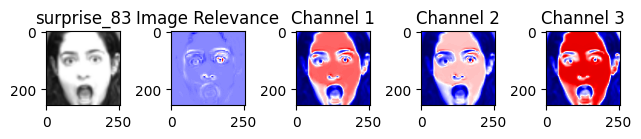

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  22
Contribution of pixels in the range [ 0.2 0.3 ] is :  48
Contribution of pixels in the range [ 0.3 0.4 ] is :  336
Contribution of pixels in the range [ 0.4 0.5 ] is :  183797
Contribution of pixels in the range [ 0.5 0.6 ] is :  10406
Contribution of pixels in the range [ 0.6 0.7 ] is :  390
Contribution of pixels in the range [ 0.7 0.8 ] is :  42
Contribution of pixels in the range [ 0.8 0.9 ] is :  20
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


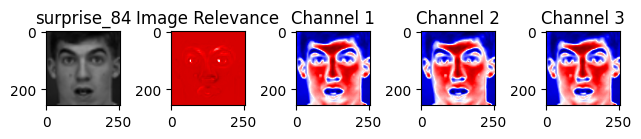

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  4
Contribution of pixels in the range [ 0.3 0.4 ] is :  8
Contribution of pixels in the range [ 0.4 0.5 ] is :  28
Contribution of pixels in the range [ 0.5 0.6 ] is :  40
Contribution of pixels in the range [ 0.6 0.7 ] is :  152
Contribution of pixels in the range [ 0.7 0.8 ] is :  2032
Contribution of pixels in the range [ 0.8 0.9 ] is :  191823
Contribution of pixels in the range [ 0.9 1.0 ] is :  983
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


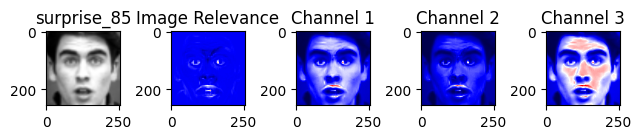

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  175
Contribution of pixels in the range [ 0.1 0.2 ] is :  10468
Contribution of pixels in the range [ 0.2 0.3 ] is :  182997
Contribution of pixels in the range [ 0.3 0.4 ] is :  1181
Contribution of pixels in the range [ 0.4 0.5 ] is :  173
Contribution of pixels in the range [ 0.5 0.6 ] is :  53
Contribution of pixels in the range [ 0.6 0.7 ] is :  20
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  1
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


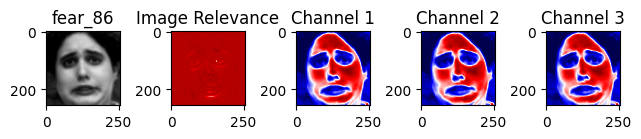

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  0
Contribution of pixels in the range [ 0.2 0.3 ] is :  1
Contribution of pixels in the range [ 0.3 0.4 ] is :  4
Contribution of pixels in the range [ 0.4 0.5 ] is :  2
Contribution of pixels in the range [ 0.5 0.6 ] is :  7
Contribution of pixels in the range [ 0.6 0.7 ] is :  79
Contribution of pixels in the range [ 0.7 0.8 ] is :  725
Contribution of pixels in the range [ 0.8 0.9 ] is :  193678
Contribution of pixels in the range [ 0.9 1.0 ] is :  578
High fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


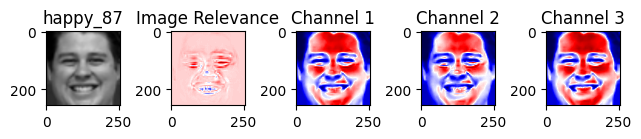

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  15
Contribution of pixels in the range [ 0.2 0.3 ] is :  31
Contribution of pixels in the range [ 0.3 0.4 ] is :  213
Contribution of pixels in the range [ 0.4 0.5 ] is :  1408
Contribution of pixels in the range [ 0.5 0.6 ] is :  181384
Contribution of pixels in the range [ 0.6 0.7 ] is :  11033
Contribution of pixels in the range [ 0.7 0.8 ] is :  815
Contribution of pixels in the range [ 0.8 0.9 ] is :  127
Contribution of pixels in the range [ 0.9 1.0 ] is :  46
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


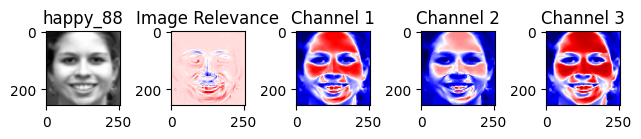

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  11
Contribution of pixels in the range [ 0.2 0.3 ] is :  104
Contribution of pixels in the range [ 0.3 0.4 ] is :  1062
Contribution of pixels in the range [ 0.4 0.5 ] is :  22916
Contribution of pixels in the range [ 0.5 0.6 ] is :  169140
Contribution of pixels in the range [ 0.6 0.7 ] is :  1585
Contribution of pixels in the range [ 0.7 0.8 ] is :  191
Contribution of pixels in the range [ 0.8 0.9 ] is :  33
Contribution of pixels in the range [ 0.9 1.0 ] is :  26
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


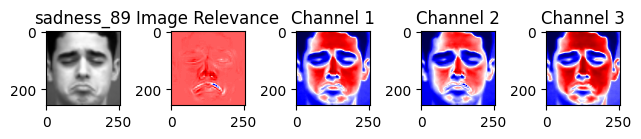

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  24
Contribution of pixels in the range [ 0.2 0.3 ] is :  43
Contribution of pixels in the range [ 0.3 0.4 ] is :  147
Contribution of pixels in the range [ 0.4 0.5 ] is :  829
Contribution of pixels in the range [ 0.5 0.6 ] is :  186794
Contribution of pixels in the range [ 0.6 0.7 ] is :  6977
Contribution of pixels in the range [ 0.7 0.8 ] is :  230
Contribution of pixels in the range [ 0.8 0.9 ] is :  21
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


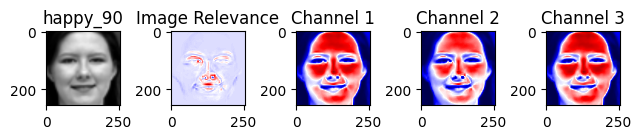

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  13
Contribution of pixels in the range [ 0.2 0.3 ] is :  25
Contribution of pixels in the range [ 0.3 0.4 ] is :  88
Contribution of pixels in the range [ 0.4 0.5 ] is :  716
Contribution of pixels in the range [ 0.5 0.6 ] is :  188759
Contribution of pixels in the range [ 0.6 0.7 ] is :  4943
Contribution of pixels in the range [ 0.7 0.8 ] is :  431
Contribution of pixels in the range [ 0.8 0.9 ] is :  71
Contribution of pixels in the range [ 0.9 1.0 ] is :  26
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


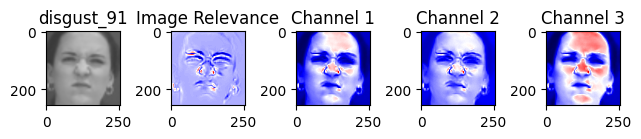

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  23
Contribution of pixels in the range [ 0.1 0.2 ] is :  123
Contribution of pixels in the range [ 0.2 0.3 ] is :  589
Contribution of pixels in the range [ 0.3 0.4 ] is :  3673
Contribution of pixels in the range [ 0.4 0.5 ] is :  179761
Contribution of pixels in the range [ 0.5 0.6 ] is :  9659
Contribution of pixels in the range [ 0.6 0.7 ] is :  968
Contribution of pixels in the range [ 0.7 0.8 ] is :  245
Contribution of pixels in the range [ 0.8 0.9 ] is :  30
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


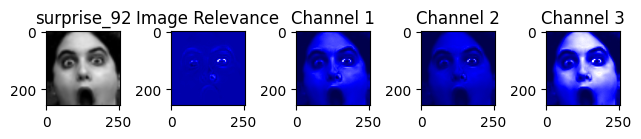

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  103
Contribution of pixels in the range [ 0.1 0.2 ] is :  185120
Contribution of pixels in the range [ 0.2 0.3 ] is :  9362
Contribution of pixels in the range [ 0.3 0.4 ] is :  363
Contribution of pixels in the range [ 0.4 0.5 ] is :  72
Contribution of pixels in the range [ 0.5 0.6 ] is :  28
Contribution of pixels in the range [ 0.6 0.7 ] is :  12
Contribution of pixels in the range [ 0.7 0.8 ] is :  6
Contribution of pixels in the range [ 0.8 0.9 ] is :  5
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


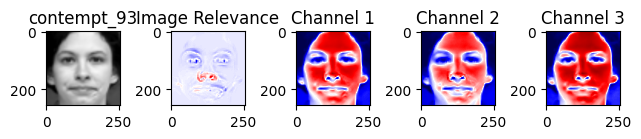

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  6
Contribution of pixels in the range [ 0.2 0.3 ] is :  25
Contribution of pixels in the range [ 0.3 0.4 ] is :  45
Contribution of pixels in the range [ 0.4 0.5 ] is :  349
Contribution of pixels in the range [ 0.5 0.6 ] is :  164967
Contribution of pixels in the range [ 0.6 0.7 ] is :  28801
Contribution of pixels in the range [ 0.7 0.8 ] is :  767
Contribution of pixels in the range [ 0.8 0.9 ] is :  93
Contribution of pixels in the range [ 0.9 1.0 ] is :  17
Medium contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


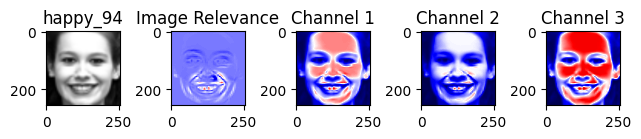

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  14
Contribution of pixels in the range [ 0.2 0.3 ] is :  76
Contribution of pixels in the range [ 0.3 0.4 ] is :  1262
Contribution of pixels in the range [ 0.4 0.5 ] is :  188218
Contribution of pixels in the range [ 0.5 0.6 ] is :  5138
Contribution of pixels in the range [ 0.6 0.7 ] is :  323
Contribution of pixels in the range [ 0.7 0.8 ] is :  32
Contribution of pixels in the range [ 0.8 0.9 ] is :  8
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


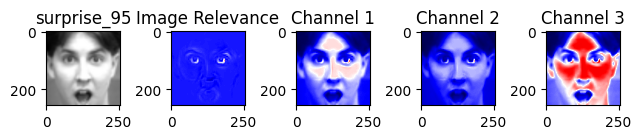

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  16
Contribution of pixels in the range [ 0.2 0.3 ] is :  371
Contribution of pixels in the range [ 0.3 0.4 ] is :  193143
Contribution of pixels in the range [ 0.4 0.5 ] is :  1334
Contribution of pixels in the range [ 0.5 0.6 ] is :  165
Contribution of pixels in the range [ 0.6 0.7 ] is :  22
Contribution of pixels in the range [ 0.7 0.8 ] is :  12
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  6
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


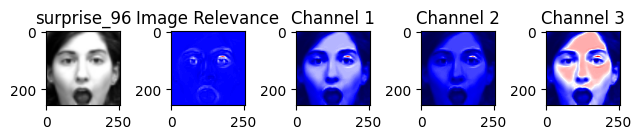

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  33
Contribution of pixels in the range [ 0.2 0.3 ] is :  5433
Contribution of pixels in the range [ 0.3 0.4 ] is :  188867
Contribution of pixels in the range [ 0.4 0.5 ] is :  616
Contribution of pixels in the range [ 0.5 0.6 ] is :  79
Contribution of pixels in the range [ 0.6 0.7 ] is :  23
Contribution of pixels in the range [ 0.7 0.8 ] is :  9
Contribution of pixels in the range [ 0.8 0.9 ] is :  8
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


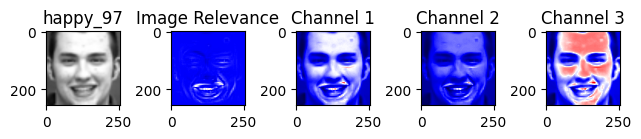

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  15
Contribution of pixels in the range [ 0.1 0.2 ] is :  132
Contribution of pixels in the range [ 0.2 0.3 ] is :  5477
Contribution of pixels in the range [ 0.3 0.4 ] is :  187055
Contribution of pixels in the range [ 0.4 0.5 ] is :  1995
Contribution of pixels in the range [ 0.5 0.6 ] is :  313
Contribution of pixels in the range [ 0.6 0.7 ] is :  60
Contribution of pixels in the range [ 0.7 0.8 ] is :  19
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


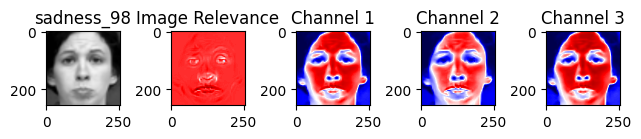

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  0
Contribution of pixels in the range [ 0.2 0.3 ] is :  8
Contribution of pixels in the range [ 0.3 0.4 ] is :  23
Contribution of pixels in the range [ 0.4 0.5 ] is :  92
Contribution of pixels in the range [ 0.5 0.6 ] is :  663
Contribution of pixels in the range [ 0.6 0.7 ] is :  23577
Contribution of pixels in the range [ 0.7 0.8 ] is :  169436
Contribution of pixels in the range [ 0.8 0.9 ] is :  1098
Contribution of pixels in the range [ 0.9 1.0 ] is :  175
High sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


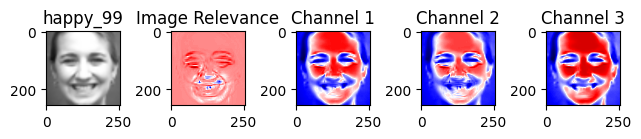

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  11
Contribution of pixels in the range [ 0.2 0.3 ] is :  33
Contribution of pixels in the range [ 0.3 0.4 ] is :  119
Contribution of pixels in the range [ 0.4 0.5 ] is :  630
Contribution of pixels in the range [ 0.5 0.6 ] is :  4652
Contribution of pixels in the range [ 0.6 0.7 ] is :  176963
Contribution of pixels in the range [ 0.7 0.8 ] is :  11817
Contribution of pixels in the range [ 0.8 0.9 ] is :  737
Contribution of pixels in the range [ 0.9 1.0 ] is :  110
High happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


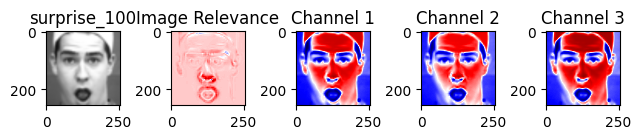

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  5
Contribution of pixels in the range [ 0.3 0.4 ] is :  18
Contribution of pixels in the range [ 0.4 0.5 ] is :  53
Contribution of pixels in the range [ 0.5 0.6 ] is :  1906
Contribution of pixels in the range [ 0.6 0.7 ] is :  189644
Contribution of pixels in the range [ 0.7 0.8 ] is :  3214
Contribution of pixels in the range [ 0.8 0.9 ] is :  212
Contribution of pixels in the range [ 0.9 1.0 ] is :  18
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


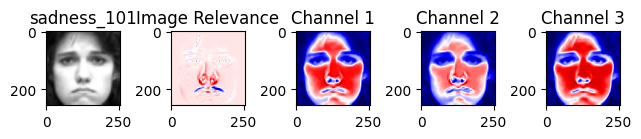

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  10
Contribution of pixels in the range [ 0.3 0.4 ] is :  86
Contribution of pixels in the range [ 0.4 0.5 ] is :  530
Contribution of pixels in the range [ 0.5 0.6 ] is :  4223
Contribution of pixels in the range [ 0.6 0.7 ] is :  188139
Contribution of pixels in the range [ 0.7 0.8 ] is :  1863
Contribution of pixels in the range [ 0.8 0.9 ] is :  206
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


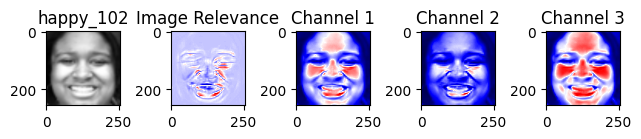

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  13
Contribution of pixels in the range [ 0.1 0.2 ] is :  42
Contribution of pixels in the range [ 0.2 0.3 ] is :  277
Contribution of pixels in the range [ 0.3 0.4 ] is :  1827
Contribution of pixels in the range [ 0.4 0.5 ] is :  175412
Contribution of pixels in the range [ 0.5 0.6 ] is :  15905
Contribution of pixels in the range [ 0.6 0.7 ] is :  1396
Contribution of pixels in the range [ 0.7 0.8 ] is :  171
Contribution of pixels in the range [ 0.8 0.9 ] is :  24
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


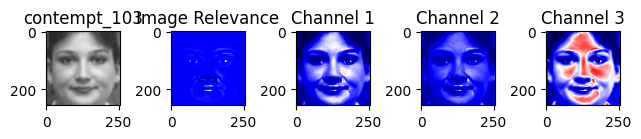

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  73
Contribution of pixels in the range [ 0.1 0.2 ] is :  3656
Contribution of pixels in the range [ 0.2 0.3 ] is :  190462
Contribution of pixels in the range [ 0.3 0.4 ] is :  761
Contribution of pixels in the range [ 0.4 0.5 ] is :  91
Contribution of pixels in the range [ 0.5 0.6 ] is :  21
Contribution of pixels in the range [ 0.6 0.7 ] is :  6
Contribution of pixels in the range [ 0.7 0.8 ] is :  1
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


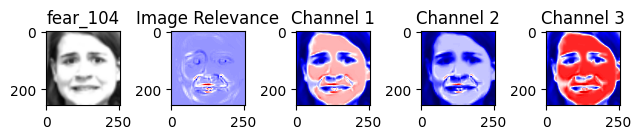

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  9
Contribution of pixels in the range [ 0.1 0.2 ] is :  30
Contribution of pixels in the range [ 0.2 0.3 ] is :  97
Contribution of pixels in the range [ 0.3 0.4 ] is :  2716
Contribution of pixels in the range [ 0.4 0.5 ] is :  189393
Contribution of pixels in the range [ 0.5 0.6 ] is :  2395
Contribution of pixels in the range [ 0.6 0.7 ] is :  316
Contribution of pixels in the range [ 0.7 0.8 ] is :  74
Contribution of pixels in the range [ 0.8 0.9 ] is :  30
Contribution of pixels in the range [ 0.9 1.0 ] is :  14
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


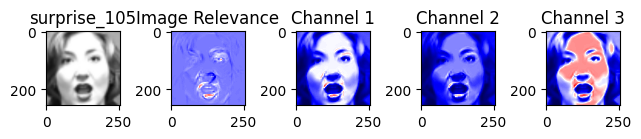

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  50
Contribution of pixels in the range [ 0.2 0.3 ] is :  1200
Contribution of pixels in the range [ 0.3 0.4 ] is :  188852
Contribution of pixels in the range [ 0.4 0.5 ] is :  4422
Contribution of pixels in the range [ 0.5 0.6 ] is :  421
Contribution of pixels in the range [ 0.6 0.7 ] is :  74
Contribution of pixels in the range [ 0.7 0.8 ] is :  25
Contribution of pixels in the range [ 0.8 0.9 ] is :  17
Contribution of pixels in the range [ 0.9 1.0 ] is :  9
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


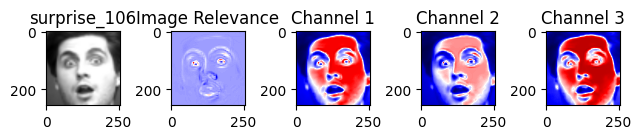

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  17
Contribution of pixels in the range [ 0.3 0.4 ] is :  205
Contribution of pixels in the range [ 0.4 0.5 ] is :  187283
Contribution of pixels in the range [ 0.5 0.6 ] is :  7255
Contribution of pixels in the range [ 0.6 0.7 ] is :  252
Contribution of pixels in the range [ 0.7 0.8 ] is :  37
Contribution of pixels in the range [ 0.8 0.9 ] is :  11
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


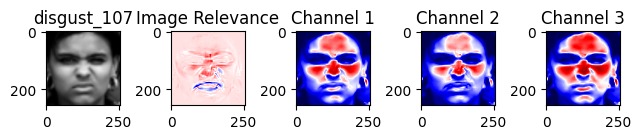

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  11
Contribution of pixels in the range [ 0.1 0.2 ] is :  25
Contribution of pixels in the range [ 0.2 0.3 ] is :  178
Contribution of pixels in the range [ 0.3 0.4 ] is :  978
Contribution of pixels in the range [ 0.4 0.5 ] is :  8606
Contribution of pixels in the range [ 0.5 0.6 ] is :  183660
Contribution of pixels in the range [ 0.6 0.7 ] is :  1522
Contribution of pixels in the range [ 0.7 0.8 ] is :  68
Contribution of pixels in the range [ 0.8 0.9 ] is :  17
Contribution of pixels in the range [ 0.9 1.0 ] is :  9
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


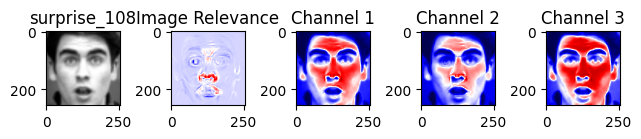

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  8
Contribution of pixels in the range [ 0.1 0.2 ] is :  10
Contribution of pixels in the range [ 0.2 0.3 ] is :  28
Contribution of pixels in the range [ 0.3 0.4 ] is :  72
Contribution of pixels in the range [ 0.4 0.5 ] is :  910
Contribution of pixels in the range [ 0.5 0.6 ] is :  189073
Contribution of pixels in the range [ 0.6 0.7 ] is :  4225
Contribution of pixels in the range [ 0.7 0.8 ] is :  620
Contribution of pixels in the range [ 0.8 0.9 ] is :  108
Contribution of pixels in the range [ 0.9 1.0 ] is :  20
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


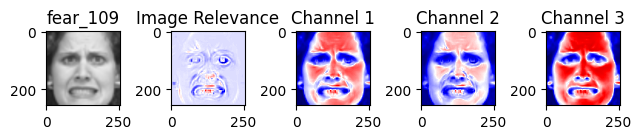

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  16
Contribution of pixels in the range [ 0.1 0.2 ] is :  61
Contribution of pixels in the range [ 0.2 0.3 ] is :  243
Contribution of pixels in the range [ 0.3 0.4 ] is :  1655
Contribution of pixels in the range [ 0.4 0.5 ] is :  169606
Contribution of pixels in the range [ 0.5 0.6 ] is :  22654
Contribution of pixels in the range [ 0.6 0.7 ] is :  735
Contribution of pixels in the range [ 0.7 0.8 ] is :  91
Contribution of pixels in the range [ 0.8 0.9 ] is :  11
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


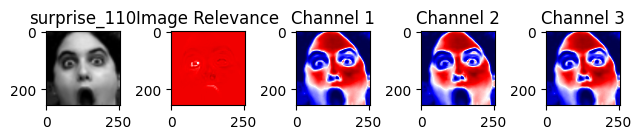

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  1
Contribution of pixels in the range [ 0.3 0.4 ] is :  12
Contribution of pixels in the range [ 0.4 0.5 ] is :  27
Contribution of pixels in the range [ 0.5 0.6 ] is :  82
Contribution of pixels in the range [ 0.6 0.7 ] is :  653
Contribution of pixels in the range [ 0.7 0.8 ] is :  193323
Contribution of pixels in the range [ 0.8 0.9 ] is :  959
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


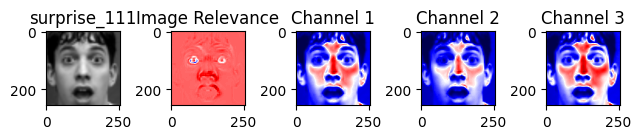

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  4
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  17
Contribution of pixels in the range [ 0.3 0.4 ] is :  58
Contribution of pixels in the range [ 0.4 0.5 ] is :  255
Contribution of pixels in the range [ 0.5 0.6 ] is :  1480
Contribution of pixels in the range [ 0.6 0.7 ] is :  188814
Contribution of pixels in the range [ 0.7 0.8 ] is :  4218
Contribution of pixels in the range [ 0.8 0.9 ] is :  210
Contribution of pixels in the range [ 0.9 1.0 ] is :  17
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


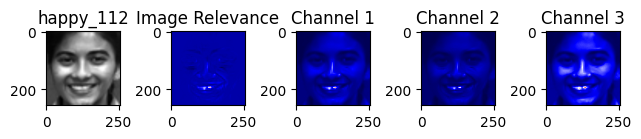

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  167
Contribution of pixels in the range [ 0.1 0.2 ] is :  188238
Contribution of pixels in the range [ 0.2 0.3 ] is :  6092
Contribution of pixels in the range [ 0.3 0.4 ] is :  449
Contribution of pixels in the range [ 0.4 0.5 ] is :  82
Contribution of pixels in the range [ 0.5 0.6 ] is :  24
Contribution of pixels in the range [ 0.6 0.7 ] is :  14
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


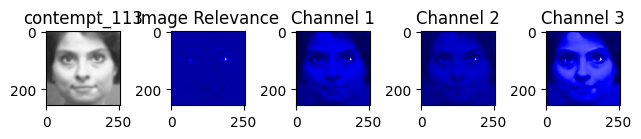

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  21
Contribution of pixels in the range [ 0.1 0.2 ] is :  193632
Contribution of pixels in the range [ 0.2 0.3 ] is :  1292
Contribution of pixels in the range [ 0.3 0.4 ] is :  88
Contribution of pixels in the range [ 0.4 0.5 ] is :  24
Contribution of pixels in the range [ 0.5 0.6 ] is :  7
Contribution of pixels in the range [ 0.6 0.7 ] is :  3
Contribution of pixels in the range [ 0.7 0.8 ] is :  5
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


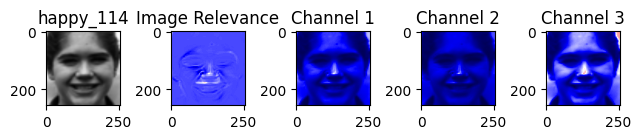

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  13
Contribution of pixels in the range [ 0.1 0.2 ] is :  301
Contribution of pixels in the range [ 0.2 0.3 ] is :  173376
Contribution of pixels in the range [ 0.3 0.4 ] is :  20847
Contribution of pixels in the range [ 0.4 0.5 ] is :  453
Contribution of pixels in the range [ 0.5 0.6 ] is :  60
Contribution of pixels in the range [ 0.6 0.7 ] is :  16
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


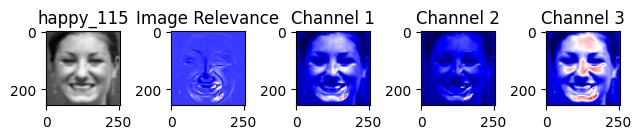

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  307
Contribution of pixels in the range [ 0.2 0.3 ] is :  32678
Contribution of pixels in the range [ 0.3 0.4 ] is :  160681
Contribution of pixels in the range [ 0.4 0.5 ] is :  1172
Contribution of pixels in the range [ 0.5 0.6 ] is :  180
Contribution of pixels in the range [ 0.6 0.7 ] is :  31
Contribution of pixels in the range [ 0.7 0.8 ] is :  14
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


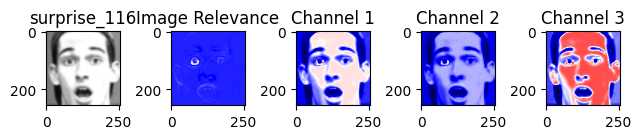

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  5
Contribution of pixels in the range [ 0.2 0.3 ] is :  93
Contribution of pixels in the range [ 0.3 0.4 ] is :  193568
Contribution of pixels in the range [ 0.4 0.5 ] is :  1182
Contribution of pixels in the range [ 0.5 0.6 ] is :  153
Contribution of pixels in the range [ 0.6 0.7 ] is :  38
Contribution of pixels in the range [ 0.7 0.8 ] is :  15
Contribution of pixels in the range [ 0.8 0.9 ] is :  14
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


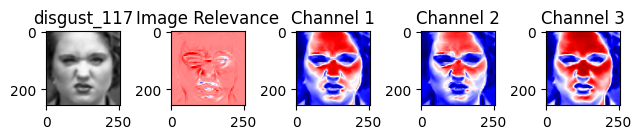

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  8
Contribution of pixels in the range [ 0.2 0.3 ] is :  20
Contribution of pixels in the range [ 0.3 0.4 ] is :  94
Contribution of pixels in the range [ 0.4 0.5 ] is :  838
Contribution of pixels in the range [ 0.5 0.6 ] is :  33954
Contribution of pixels in the range [ 0.6 0.7 ] is :  158793
Contribution of pixels in the range [ 0.7 0.8 ] is :  1183
Contribution of pixels in the range [ 0.8 0.9 ] is :  165
Contribution of pixels in the range [ 0.9 1.0 ] is :  17
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


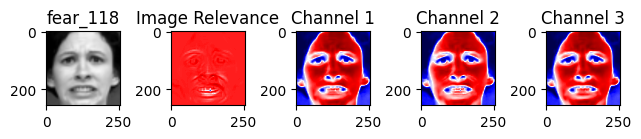

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  10
Contribution of pixels in the range [ 0.3 0.4 ] is :  36
Contribution of pixels in the range [ 0.4 0.5 ] is :  252
Contribution of pixels in the range [ 0.5 0.6 ] is :  2271
Contribution of pixels in the range [ 0.6 0.7 ] is :  191355
Contribution of pixels in the range [ 0.7 0.8 ] is :  1074
Contribution of pixels in the range [ 0.8 0.9 ] is :  61
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


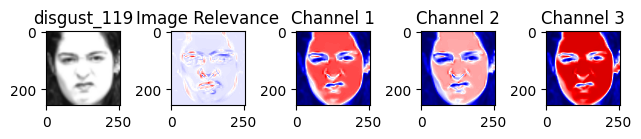

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  10
Contribution of pixels in the range [ 0.3 0.4 ] is :  67
Contribution of pixels in the range [ 0.4 0.5 ] is :  649
Contribution of pixels in the range [ 0.5 0.6 ] is :  184762
Contribution of pixels in the range [ 0.6 0.7 ] is :  8998
Contribution of pixels in the range [ 0.7 0.8 ] is :  506
Contribution of pixels in the range [ 0.8 0.9 ] is :  62
Contribution of pixels in the range [ 0.9 1.0 ] is :  16
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


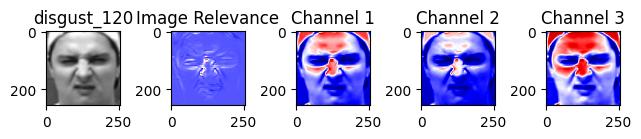

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  8
Contribution of pixels in the range [ 0.2 0.3 ] is :  95
Contribution of pixels in the range [ 0.3 0.4 ] is :  1857
Contribution of pixels in the range [ 0.4 0.5 ] is :  190592
Contribution of pixels in the range [ 0.5 0.6 ] is :  2228
Contribution of pixels in the range [ 0.6 0.7 ] is :  241
Contribution of pixels in the range [ 0.7 0.8 ] is :  39
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


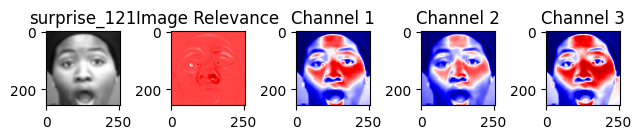

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  3
Contribution of pixels in the range [ 0.3 0.4 ] is :  8
Contribution of pixels in the range [ 0.4 0.5 ] is :  24
Contribution of pixels in the range [ 0.5 0.6 ] is :  246
Contribution of pixels in the range [ 0.6 0.7 ] is :  191484
Contribution of pixels in the range [ 0.7 0.8 ] is :  3134
Contribution of pixels in the range [ 0.8 0.9 ] is :  160
Contribution of pixels in the range [ 0.9 1.0 ] is :  14
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


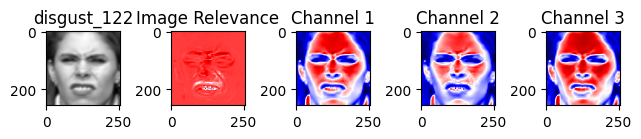

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  7
Contribution of pixels in the range [ 0.1 0.2 ] is :  8
Contribution of pixels in the range [ 0.2 0.3 ] is :  20
Contribution of pixels in the range [ 0.3 0.4 ] is :  69
Contribution of pixels in the range [ 0.4 0.5 ] is :  262
Contribution of pixels in the range [ 0.5 0.6 ] is :  1854
Contribution of pixels in the range [ 0.6 0.7 ] is :  182714
Contribution of pixels in the range [ 0.7 0.8 ] is :  9734
Contribution of pixels in the range [ 0.8 0.9 ] is :  382
Contribution of pixels in the range [ 0.9 1.0 ] is :  24
High disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


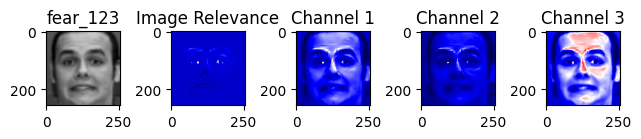

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  190
Contribution of pixels in the range [ 0.1 0.2 ] is :  187018
Contribution of pixels in the range [ 0.2 0.3 ] is :  7541
Contribution of pixels in the range [ 0.3 0.4 ] is :  253
Contribution of pixels in the range [ 0.4 0.5 ] is :  40
Contribution of pixels in the range [ 0.5 0.6 ] is :  17
Contribution of pixels in the range [ 0.6 0.7 ] is :  7
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


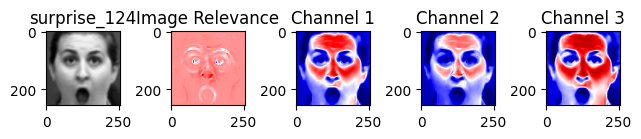

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  11
Contribution of pixels in the range [ 0.2 0.3 ] is :  23
Contribution of pixels in the range [ 0.3 0.4 ] is :  62
Contribution of pixels in the range [ 0.4 0.5 ] is :  628
Contribution of pixels in the range [ 0.5 0.6 ] is :  55233
Contribution of pixels in the range [ 0.6 0.7 ] is :  138902
Contribution of pixels in the range [ 0.7 0.8 ] is :  189
Contribution of pixels in the range [ 0.8 0.9 ] is :  18
Contribution of pixels in the range [ 0.9 1.0 ] is :  6
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


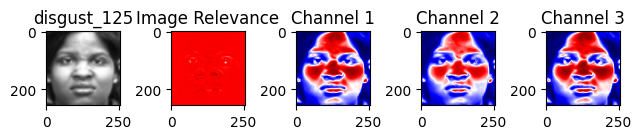

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  1
Contribution of pixels in the range [ 0.3 0.4 ] is :  4
Contribution of pixels in the range [ 0.4 0.5 ] is :  10
Contribution of pixels in the range [ 0.5 0.6 ] is :  30
Contribution of pixels in the range [ 0.6 0.7 ] is :  692
Contribution of pixels in the range [ 0.7 0.8 ] is :  193942
Contribution of pixels in the range [ 0.8 0.9 ] is :  381
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
High disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


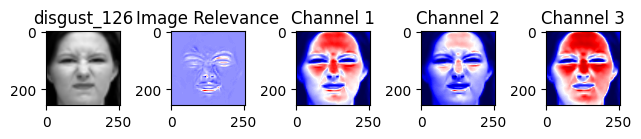

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  54
Contribution of pixels in the range [ 0.3 0.4 ] is :  685
Contribution of pixels in the range [ 0.4 0.5 ] is :  189541
Contribution of pixels in the range [ 0.5 0.6 ] is :  4388
Contribution of pixels in the range [ 0.6 0.7 ] is :  339
Contribution of pixels in the range [ 0.7 0.8 ] is :  49
Contribution of pixels in the range [ 0.8 0.9 ] is :  6
Contribution of pixels in the range [ 0.9 1.0 ] is :  6
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


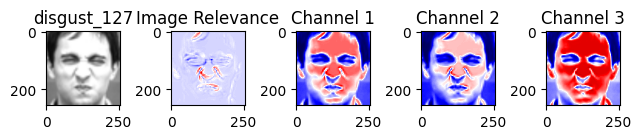

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  12
Contribution of pixels in the range [ 0.2 0.3 ] is :  17
Contribution of pixels in the range [ 0.3 0.4 ] is :  86
Contribution of pixels in the range [ 0.4 0.5 ] is :  1450
Contribution of pixels in the range [ 0.5 0.6 ] is :  189638
Contribution of pixels in the range [ 0.6 0.7 ] is :  3530
Contribution of pixels in the range [ 0.7 0.8 ] is :  290
Contribution of pixels in the range [ 0.8 0.9 ] is :  39
Contribution of pixels in the range [ 0.9 1.0 ] is :  12
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


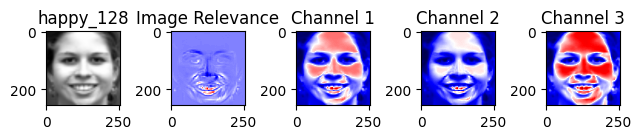

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  12
Contribution of pixels in the range [ 0.2 0.3 ] is :  49
Contribution of pixels in the range [ 0.3 0.4 ] is :  577
Contribution of pixels in the range [ 0.4 0.5 ] is :  179994
Contribution of pixels in the range [ 0.5 0.6 ] is :  13481
Contribution of pixels in the range [ 0.6 0.7 ] is :  803
Contribution of pixels in the range [ 0.7 0.8 ] is :  116
Contribution of pixels in the range [ 0.8 0.9 ] is :  32
Contribution of pixels in the range [ 0.9 1.0 ] is :  8
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


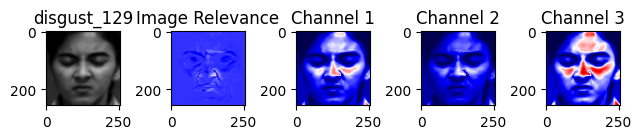

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  15
Contribution of pixels in the range [ 0.2 0.3 ] is :  234
Contribution of pixels in the range [ 0.3 0.4 ] is :  190509
Contribution of pixels in the range [ 0.4 0.5 ] is :  4197
Contribution of pixels in the range [ 0.5 0.6 ] is :  93
Contribution of pixels in the range [ 0.6 0.7 ] is :  14
Contribution of pixels in the range [ 0.7 0.8 ] is :  6
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


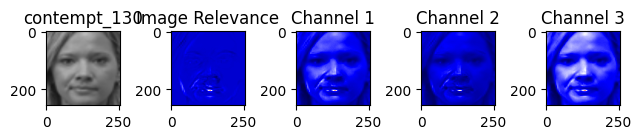

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  100
Contribution of pixels in the range [ 0.1 0.2 ] is :  67052
Contribution of pixels in the range [ 0.2 0.3 ] is :  127336
Contribution of pixels in the range [ 0.3 0.4 ] is :  497
Contribution of pixels in the range [ 0.4 0.5 ] is :  50
Contribution of pixels in the range [ 0.5 0.6 ] is :  23
Contribution of pixels in the range [ 0.6 0.7 ] is :  6
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


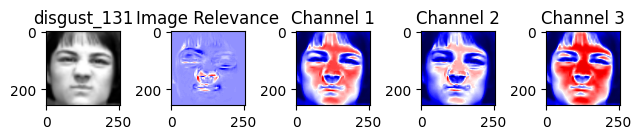

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  16
Contribution of pixels in the range [ 0.1 0.2 ] is :  30
Contribution of pixels in the range [ 0.2 0.3 ] is :  91
Contribution of pixels in the range [ 0.3 0.4 ] is :  1033
Contribution of pixels in the range [ 0.4 0.5 ] is :  174659
Contribution of pixels in the range [ 0.5 0.6 ] is :  17494
Contribution of pixels in the range [ 0.6 0.7 ] is :  1500
Contribution of pixels in the range [ 0.7 0.8 ] is :  191
Contribution of pixels in the range [ 0.8 0.9 ] is :  49
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


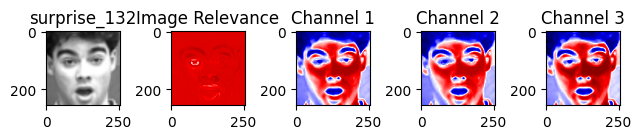

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  3
Contribution of pixels in the range [ 0.3 0.4 ] is :  13
Contribution of pixels in the range [ 0.4 0.5 ] is :  26
Contribution of pixels in the range [ 0.5 0.6 ] is :  118
Contribution of pixels in the range [ 0.6 0.7 ] is :  770
Contribution of pixels in the range [ 0.7 0.8 ] is :  180892
Contribution of pixels in the range [ 0.8 0.9 ] is :  13151
Contribution of pixels in the range [ 0.9 1.0 ] is :  99
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


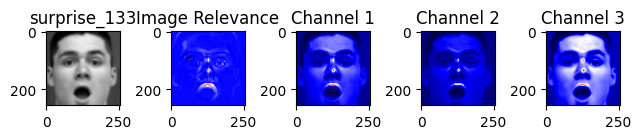

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  41
Contribution of pixels in the range [ 0.1 0.2 ] is :  393
Contribution of pixels in the range [ 0.2 0.3 ] is :  180778
Contribution of pixels in the range [ 0.3 0.4 ] is :  12837
Contribution of pixels in the range [ 0.4 0.5 ] is :  737
Contribution of pixels in the range [ 0.5 0.6 ] is :  192
Contribution of pixels in the range [ 0.6 0.7 ] is :  53
Contribution of pixels in the range [ 0.7 0.8 ] is :  32
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


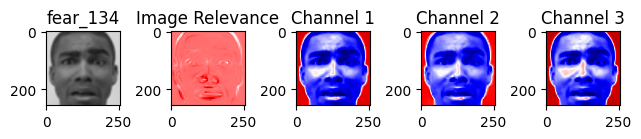

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  25
Contribution of pixels in the range [ 0.3 0.4 ] is :  92
Contribution of pixels in the range [ 0.4 0.5 ] is :  604
Contribution of pixels in the range [ 0.5 0.6 ] is :  27720
Contribution of pixels in the range [ 0.6 0.7 ] is :  165843
Contribution of pixels in the range [ 0.7 0.8 ] is :  680
Contribution of pixels in the range [ 0.8 0.9 ] is :  83
Contribution of pixels in the range [ 0.9 1.0 ] is :  17
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


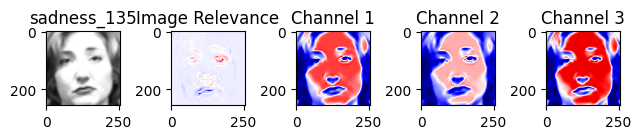

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  8
Contribution of pixels in the range [ 0.1 0.2 ] is :  13
Contribution of pixels in the range [ 0.2 0.3 ] is :  26
Contribution of pixels in the range [ 0.3 0.4 ] is :  187
Contribution of pixels in the range [ 0.4 0.5 ] is :  25836
Contribution of pixels in the range [ 0.5 0.6 ] is :  168592
Contribution of pixels in the range [ 0.6 0.7 ] is :  336
Contribution of pixels in the range [ 0.7 0.8 ] is :  48
Contribution of pixels in the range [ 0.8 0.9 ] is :  19
Contribution of pixels in the range [ 0.9 1.0 ] is :  9
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


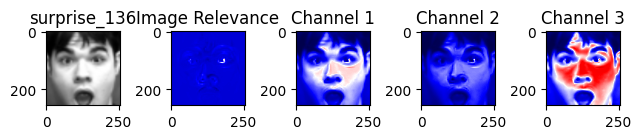

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  15
Contribution of pixels in the range [ 0.1 0.2 ] is :  1014
Contribution of pixels in the range [ 0.2 0.3 ] is :  193274
Contribution of pixels in the range [ 0.3 0.4 ] is :  632
Contribution of pixels in the range [ 0.4 0.5 ] is :  104
Contribution of pixels in the range [ 0.5 0.6 ] is :  22
Contribution of pixels in the range [ 0.6 0.7 ] is :  6
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  1
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


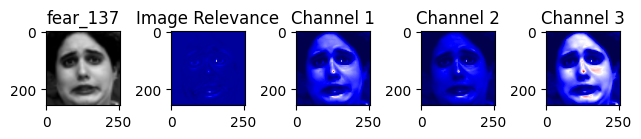

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  382
Contribution of pixels in the range [ 0.1 0.2 ] is :  193270
Contribution of pixels in the range [ 0.2 0.3 ] is :  1275
Contribution of pixels in the range [ 0.3 0.4 ] is :  105
Contribution of pixels in the range [ 0.4 0.5 ] is :  25
Contribution of pixels in the range [ 0.5 0.6 ] is :  11
Contribution of pixels in the range [ 0.6 0.7 ] is :  3
Contribution of pixels in the range [ 0.7 0.8 ] is :  2
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


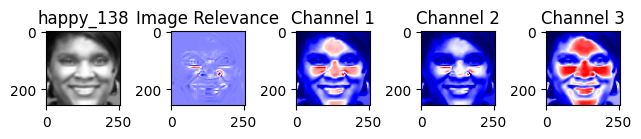

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  5
Contribution of pixels in the range [ 0.1 0.2 ] is :  10
Contribution of pixels in the range [ 0.2 0.3 ] is :  51
Contribution of pixels in the range [ 0.3 0.4 ] is :  358
Contribution of pixels in the range [ 0.4 0.5 ] is :  181748
Contribution of pixels in the range [ 0.5 0.6 ] is :  11969
Contribution of pixels in the range [ 0.6 0.7 ] is :  736
Contribution of pixels in the range [ 0.7 0.8 ] is :  142
Contribution of pixels in the range [ 0.8 0.9 ] is :  48
Contribution of pixels in the range [ 0.9 1.0 ] is :  7
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


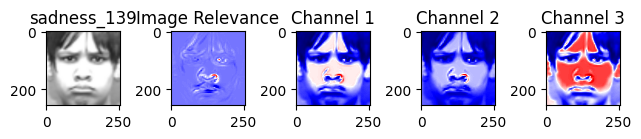

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  25
Contribution of pixels in the range [ 0.1 0.2 ] is :  58
Contribution of pixels in the range [ 0.2 0.3 ] is :  610
Contribution of pixels in the range [ 0.3 0.4 ] is :  183368
Contribution of pixels in the range [ 0.4 0.5 ] is :  10364
Contribution of pixels in the range [ 0.5 0.6 ] is :  480
Contribution of pixels in the range [ 0.6 0.7 ] is :  119
Contribution of pixels in the range [ 0.7 0.8 ] is :  39
Contribution of pixels in the range [ 0.8 0.9 ] is :  9
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


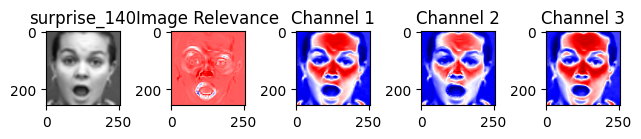

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  3
Contribution of pixels in the range [ 0.1 0.2 ] is :  5
Contribution of pixels in the range [ 0.2 0.3 ] is :  19
Contribution of pixels in the range [ 0.3 0.4 ] is :  104
Contribution of pixels in the range [ 0.4 0.5 ] is :  834
Contribution of pixels in the range [ 0.5 0.6 ] is :  6064
Contribution of pixels in the range [ 0.6 0.7 ] is :  184845
Contribution of pixels in the range [ 0.7 0.8 ] is :  2983
Contribution of pixels in the range [ 0.8 0.9 ] is :  178
Contribution of pixels in the range [ 0.9 1.0 ] is :  39
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


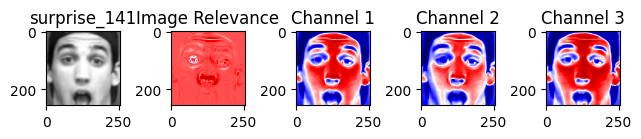

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  16
Contribution of pixels in the range [ 0.3 0.4 ] is :  41
Contribution of pixels in the range [ 0.4 0.5 ] is :  179
Contribution of pixels in the range [ 0.5 0.6 ] is :  859
Contribution of pixels in the range [ 0.6 0.7 ] is :  67148
Contribution of pixels in the range [ 0.7 0.8 ] is :  124839
Contribution of pixels in the range [ 0.8 0.9 ] is :  1781
Contribution of pixels in the range [ 0.9 1.0 ] is :  207
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


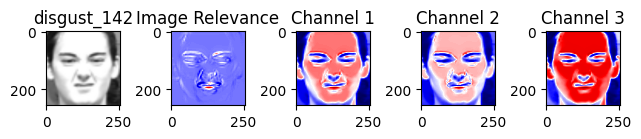

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  12
Contribution of pixels in the range [ 0.1 0.2 ] is :  7
Contribution of pixels in the range [ 0.2 0.3 ] is :  74
Contribution of pixels in the range [ 0.3 0.4 ] is :  622
Contribution of pixels in the range [ 0.4 0.5 ] is :  63055
Contribution of pixels in the range [ 0.5 0.6 ] is :  129582
Contribution of pixels in the range [ 0.6 0.7 ] is :  1456
Contribution of pixels in the range [ 0.7 0.8 ] is :  193
Contribution of pixels in the range [ 0.8 0.9 ] is :  58
Contribution of pixels in the range [ 0.9 1.0 ] is :  15
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


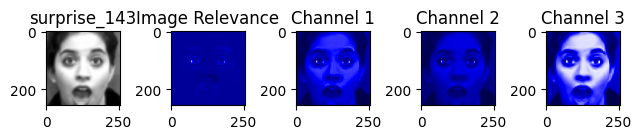

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  491
Contribution of pixels in the range [ 0.1 0.2 ] is :  193790
Contribution of pixels in the range [ 0.2 0.3 ] is :  695
Contribution of pixels in the range [ 0.3 0.4 ] is :  55
Contribution of pixels in the range [ 0.4 0.5 ] is :  23
Contribution of pixels in the range [ 0.5 0.6 ] is :  12
Contribution of pixels in the range [ 0.6 0.7 ] is :  3
Contribution of pixels in the range [ 0.7 0.8 ] is :  3
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


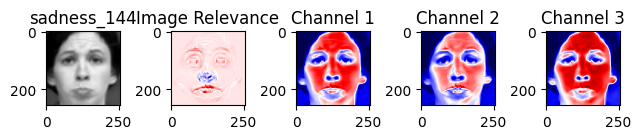

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  11
Contribution of pixels in the range [ 0.3 0.4 ] is :  72
Contribution of pixels in the range [ 0.4 0.5 ] is :  539
Contribution of pixels in the range [ 0.5 0.6 ] is :  12874
Contribution of pixels in the range [ 0.6 0.7 ] is :  180472
Contribution of pixels in the range [ 0.7 0.8 ] is :  926
Contribution of pixels in the range [ 0.8 0.9 ] is :  140
Contribution of pixels in the range [ 0.9 1.0 ] is :  37
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


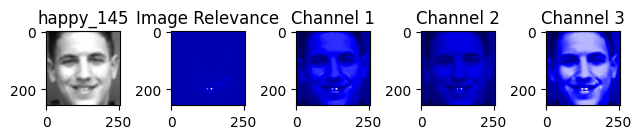

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  47
Contribution of pixels in the range [ 0.1 0.2 ] is :  178474
Contribution of pixels in the range [ 0.2 0.3 ] is :  16371
Contribution of pixels in the range [ 0.3 0.4 ] is :  130
Contribution of pixels in the range [ 0.4 0.5 ] is :  31
Contribution of pixels in the range [ 0.5 0.6 ] is :  13
Contribution of pixels in the range [ 0.6 0.7 ] is :  2
Contribution of pixels in the range [ 0.7 0.8 ] is :  5
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


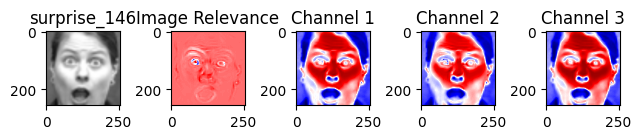

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  38
Contribution of pixels in the range [ 0.3 0.4 ] is :  119
Contribution of pixels in the range [ 0.4 0.5 ] is :  629
Contribution of pixels in the range [ 0.5 0.6 ] is :  186817
Contribution of pixels in the range [ 0.6 0.7 ] is :  7378
Contribution of pixels in the range [ 0.7 0.8 ] is :  75
Contribution of pixels in the range [ 0.8 0.9 ] is :  11
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Medium surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


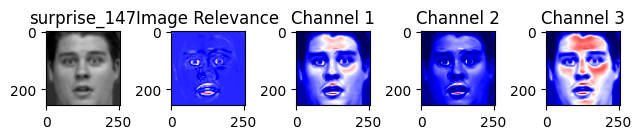

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  9
Contribution of pixels in the range [ 0.1 0.2 ] is :  181
Contribution of pixels in the range [ 0.2 0.3 ] is :  6738
Contribution of pixels in the range [ 0.3 0.4 ] is :  185731
Contribution of pixels in the range [ 0.4 0.5 ] is :  1813
Contribution of pixels in the range [ 0.5 0.6 ] is :  402
Contribution of pixels in the range [ 0.6 0.7 ] is :  126
Contribution of pixels in the range [ 0.7 0.8 ] is :  49
Contribution of pixels in the range [ 0.8 0.9 ] is :  22
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: fear


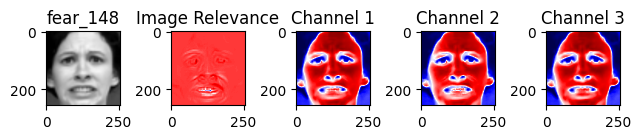

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  2
Contribution of pixels in the range [ 0.2 0.3 ] is :  16
Contribution of pixels in the range [ 0.3 0.4 ] is :  36
Contribution of pixels in the range [ 0.4 0.5 ] is :  218
Contribution of pixels in the range [ 0.5 0.6 ] is :  1972
Contribution of pixels in the range [ 0.6 0.7 ] is :  191619
Contribution of pixels in the range [ 0.7 0.8 ] is :  1116
Contribution of pixels in the range [ 0.8 0.9 ] is :  81
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
Medium fear
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


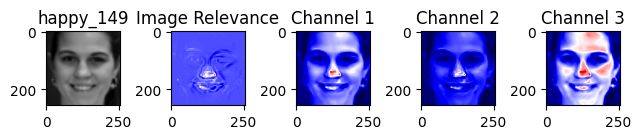

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  17
Contribution of pixels in the range [ 0.1 0.2 ] is :  80
Contribution of pixels in the range [ 0.2 0.3 ] is :  971
Contribution of pixels in the range [ 0.3 0.4 ] is :  187931
Contribution of pixels in the range [ 0.4 0.5 ] is :  5554
Contribution of pixels in the range [ 0.5 0.6 ] is :  418
Contribution of pixels in the range [ 0.6 0.7 ] is :  74
Contribution of pixels in the range [ 0.7 0.8 ] is :  14
Contribution of pixels in the range [ 0.8 0.9 ] is :  11
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


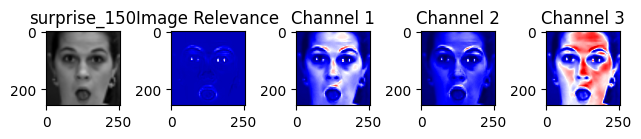

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  118
Contribution of pixels in the range [ 0.1 0.2 ] is :  34858
Contribution of pixels in the range [ 0.2 0.3 ] is :  158777
Contribution of pixels in the range [ 0.3 0.4 ] is :  1145
Contribution of pixels in the range [ 0.4 0.5 ] is :  92
Contribution of pixels in the range [ 0.5 0.6 ] is :  38
Contribution of pixels in the range [ 0.6 0.7 ] is :  22
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  12
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


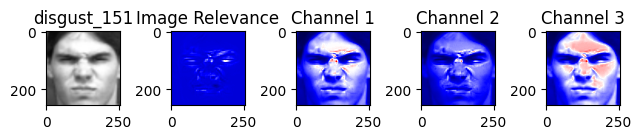

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  70
Contribution of pixels in the range [ 0.1 0.2 ] is :  461
Contribution of pixels in the range [ 0.2 0.3 ] is :  173062
Contribution of pixels in the range [ 0.3 0.4 ] is :  20336
Contribution of pixels in the range [ 0.4 0.5 ] is :  977
Contribution of pixels in the range [ 0.5 0.6 ] is :  125
Contribution of pixels in the range [ 0.6 0.7 ] is :  14
Contribution of pixels in the range [ 0.7 0.8 ] is :  14
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  8
Low disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


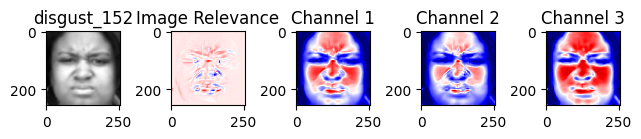

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  7
Contribution of pixels in the range [ 0.1 0.2 ] is :  31
Contribution of pixels in the range [ 0.2 0.3 ] is :  302
Contribution of pixels in the range [ 0.3 0.4 ] is :  7378
Contribution of pixels in the range [ 0.4 0.5 ] is :  186575
Contribution of pixels in the range [ 0.5 0.6 ] is :  701
Contribution of pixels in the range [ 0.6 0.7 ] is :  64
Contribution of pixels in the range [ 0.7 0.8 ] is :  12
Contribution of pixels in the range [ 0.8 0.9 ] is :  3
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


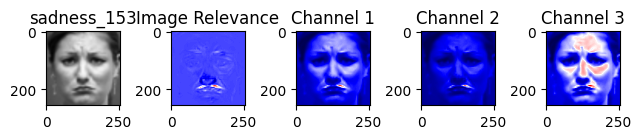

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  29
Contribution of pixels in the range [ 0.1 0.2 ] is :  337
Contribution of pixels in the range [ 0.2 0.3 ] is :  179242
Contribution of pixels in the range [ 0.3 0.4 ] is :  14742
Contribution of pixels in the range [ 0.4 0.5 ] is :  559
Contribution of pixels in the range [ 0.5 0.6 ] is :  112
Contribution of pixels in the range [ 0.6 0.7 ] is :  39
Contribution of pixels in the range [ 0.7 0.8 ] is :  6
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  4
Low sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


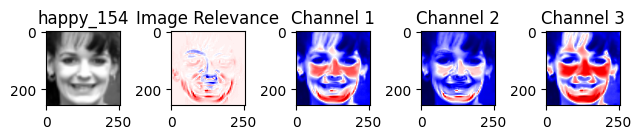

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  17
Contribution of pixels in the range [ 0.1 0.2 ] is :  46
Contribution of pixels in the range [ 0.2 0.3 ] is :  248
Contribution of pixels in the range [ 0.3 0.4 ] is :  2896
Contribution of pixels in the range [ 0.4 0.5 ] is :  179988
Contribution of pixels in the range [ 0.5 0.6 ] is :  10840
Contribution of pixels in the range [ 0.6 0.7 ] is :  830
Contribution of pixels in the range [ 0.7 0.8 ] is :  173
Contribution of pixels in the range [ 0.8 0.9 ] is :  31
Contribution of pixels in the range [ 0.9 1.0 ] is :  5
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


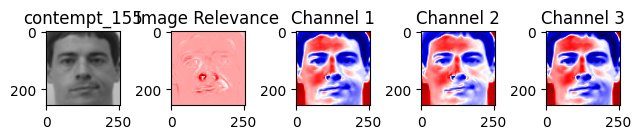

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  5
Contribution of pixels in the range [ 0.1 0.2 ] is :  9
Contribution of pixels in the range [ 0.2 0.3 ] is :  7
Contribution of pixels in the range [ 0.3 0.4 ] is :  20
Contribution of pixels in the range [ 0.4 0.5 ] is :  73
Contribution of pixels in the range [ 0.5 0.6 ] is :  834
Contribution of pixels in the range [ 0.6 0.7 ] is :  191344
Contribution of pixels in the range [ 0.7 0.8 ] is :  2476
Contribution of pixels in the range [ 0.8 0.9 ] is :  249
Contribution of pixels in the range [ 0.9 1.0 ] is :  57
High contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


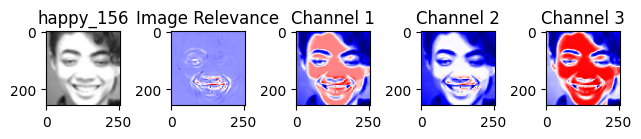

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  7
Contribution of pixels in the range [ 0.1 0.2 ] is :  28
Contribution of pixels in the range [ 0.2 0.3 ] is :  91
Contribution of pixels in the range [ 0.3 0.4 ] is :  399
Contribution of pixels in the range [ 0.4 0.5 ] is :  184692
Contribution of pixels in the range [ 0.5 0.6 ] is :  8900
Contribution of pixels in the range [ 0.6 0.7 ] is :  783
Contribution of pixels in the range [ 0.7 0.8 ] is :  138
Contribution of pixels in the range [ 0.8 0.9 ] is :  25
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


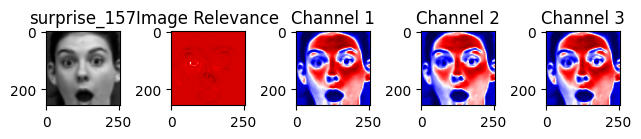

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  1
Contribution of pixels in the range [ 0.3 0.4 ] is :  2
Contribution of pixels in the range [ 0.4 0.5 ] is :  8
Contribution of pixels in the range [ 0.5 0.6 ] is :  16
Contribution of pixels in the range [ 0.6 0.7 ] is :  64
Contribution of pixels in the range [ 0.7 0.8 ] is :  1151
Contribution of pixels in the range [ 0.8 0.9 ] is :  193251
Contribution of pixels in the range [ 0.9 1.0 ] is :  579
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


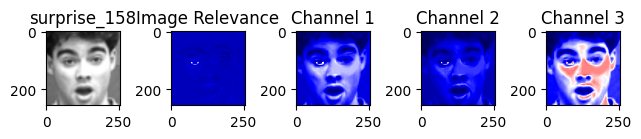

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  153
Contribution of pixels in the range [ 0.1 0.2 ] is :  190871
Contribution of pixels in the range [ 0.2 0.3 ] is :  3854
Contribution of pixels in the range [ 0.3 0.4 ] is :  135
Contribution of pixels in the range [ 0.4 0.5 ] is :  33
Contribution of pixels in the range [ 0.5 0.6 ] is :  15
Contribution of pixels in the range [ 0.6 0.7 ] is :  7
Contribution of pixels in the range [ 0.7 0.8 ] is :  4
Contribution of pixels in the range [ 0.8 0.9 ] is :  0
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: sadness


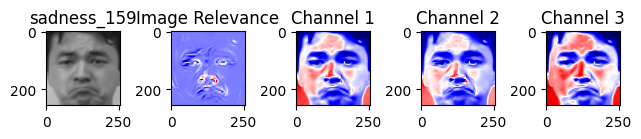

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  10
Contribution of pixels in the range [ 0.1 0.2 ] is :  37
Contribution of pixels in the range [ 0.2 0.3 ] is :  156
Contribution of pixels in the range [ 0.3 0.4 ] is :  1240
Contribution of pixels in the range [ 0.4 0.5 ] is :  181324
Contribution of pixels in the range [ 0.5 0.6 ] is :  11191
Contribution of pixels in the range [ 0.6 0.7 ] is :  908
Contribution of pixels in the range [ 0.7 0.8 ] is :  156
Contribution of pixels in the range [ 0.8 0.9 ] is :  39
Contribution of pixels in the range [ 0.9 1.0 ] is :  13
Medium sadness
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


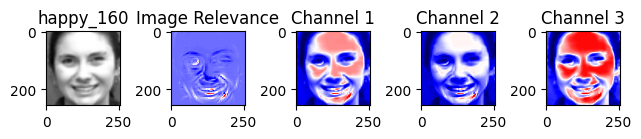

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  2
Contribution of pixels in the range [ 0.1 0.2 ] is :  21
Contribution of pixels in the range [ 0.2 0.3 ] is :  85
Contribution of pixels in the range [ 0.3 0.4 ] is :  2083
Contribution of pixels in the range [ 0.4 0.5 ] is :  185916
Contribution of pixels in the range [ 0.5 0.6 ] is :  6112
Contribution of pixels in the range [ 0.6 0.7 ] is :  634
Contribution of pixels in the range [ 0.7 0.8 ] is :  147
Contribution of pixels in the range [ 0.8 0.9 ] is :  59
Contribution of pixels in the range [ 0.9 1.0 ] is :  15
Medium happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: contempt


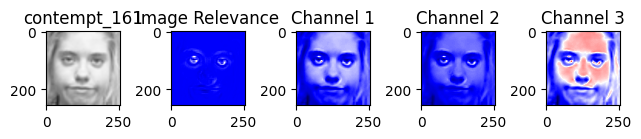

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  12
Contribution of pixels in the range [ 0.1 0.2 ] is :  33
Contribution of pixels in the range [ 0.2 0.3 ] is :  1565
Contribution of pixels in the range [ 0.3 0.4 ] is :  192431
Contribution of pixels in the range [ 0.4 0.5 ] is :  897
Contribution of pixels in the range [ 0.5 0.6 ] is :  105
Contribution of pixels in the range [ 0.6 0.7 ] is :  21
Contribution of pixels in the range [ 0.7 0.8 ] is :  7
Contribution of pixels in the range [ 0.8 0.9 ] is :  2
Contribution of pixels in the range [ 0.9 1.0 ] is :  1
Low contempt
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


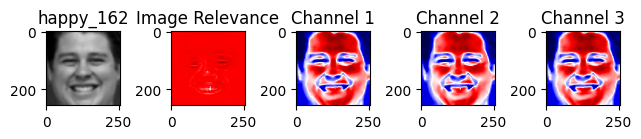

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  0
Contribution of pixels in the range [ 0.1 0.2 ] is :  1
Contribution of pixels in the range [ 0.2 0.3 ] is :  4
Contribution of pixels in the range [ 0.3 0.4 ] is :  2
Contribution of pixels in the range [ 0.4 0.5 ] is :  17
Contribution of pixels in the range [ 0.5 0.6 ] is :  61
Contribution of pixels in the range [ 0.6 0.7 ] is :  575
Contribution of pixels in the range [ 0.7 0.8 ] is :  189544
Contribution of pixels in the range [ 0.8 0.9 ] is :  4756
Contribution of pixels in the range [ 0.9 1.0 ] is :  114
High happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


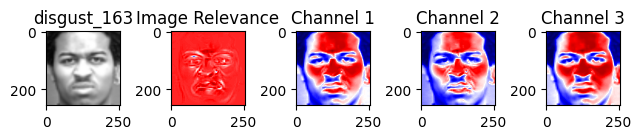

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  6
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  18
Contribution of pixels in the range [ 0.3 0.4 ] is :  64
Contribution of pixels in the range [ 0.4 0.5 ] is :  484
Contribution of pixels in the range [ 0.5 0.6 ] is :  7822
Contribution of pixels in the range [ 0.6 0.7 ] is :  183302
Contribution of pixels in the range [ 0.7 0.8 ] is :  3154
Contribution of pixels in the range [ 0.8 0.9 ] is :  210
Contribution of pixels in the range [ 0.9 1.0 ] is :  11
Medium disgust
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: happy


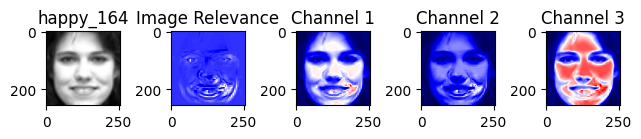

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  17
Contribution of pixels in the range [ 0.1 0.2 ] is :  75
Contribution of pixels in the range [ 0.2 0.3 ] is :  1281
Contribution of pixels in the range [ 0.3 0.4 ] is :  183324
Contribution of pixels in the range [ 0.4 0.5 ] is :  9486
Contribution of pixels in the range [ 0.5 0.6 ] is :  805
Contribution of pixels in the range [ 0.6 0.7 ] is :  70
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Low happy
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: surprise


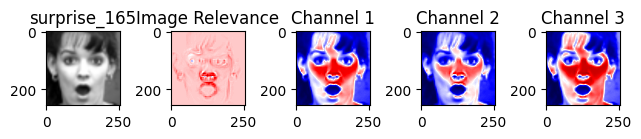

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  1
Contribution of pixels in the range [ 0.1 0.2 ] is :  3
Contribution of pixels in the range [ 0.2 0.3 ] is :  13
Contribution of pixels in the range [ 0.3 0.4 ] is :  16
Contribution of pixels in the range [ 0.4 0.5 ] is :  60
Contribution of pixels in the range [ 0.5 0.6 ] is :  1480
Contribution of pixels in the range [ 0.6 0.7 ] is :  191112
Contribution of pixels in the range [ 0.7 0.8 ] is :  2147
Contribution of pixels in the range [ 0.8 0.9 ] is :  215
Contribution of pixels in the range [ 0.9 1.0 ] is :  27
High surprise
-------------------------------------------------------------------------------------------------------
Groundtruth for this image: disgust


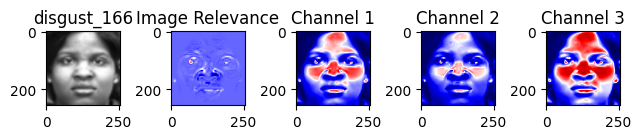

-------------------------------------------------------------------------------------------------------
Contribution of pixels in the range [ 0.0 0.1 ] is :  15
Contribution of pixels in the range [ 0.1 0.2 ] is :  157
Contribution of pixels in the range [ 0.2 0.3 ] is :  1258
Contribution of pixels in the range [ 0.3 0.4 ] is :  190528
Contribution of pixels in the range [ 0.4 0.5 ] is :  2837
Contribution of pixels in the range [ 0.5 0.6 ] is :  219
Contribution of pixels in the range [ 0.6 0.7 ] is :  40
Contribution of pixels in the range [ 0.7 0.8 ] is :  10
Contribution of pixels in the range [ 0.8 0.9 ] is :  7
Contribution of pixels in the range [ 0.9 1.0 ] is :  3
Low disgust
-------------------------------------------------------------------------------------------------------


In [53]:
# emotion_class = 'happy'  # Specify the emotion class for which you want to generate relevance scores

folder_path = '/content/drive/MyDrive/hm'
n = 1
image_names = []
positive = []
negative_counts = []
relevance_scores = []

for inputs, labels in test_loader:
    inputs = inputs.to(device)
    outputs = model(inputs).max(1).indices.detach().cpu().numpy()
    for i in range(inputs.shape[0]):
        image_id = i

        try:
            image_relevances = apply_lrp_on_vgg16(model, inputs[image_id])
            image_relevances = image_relevances.permute(0, 2, 3, 1).detach().cpu().numpy()[0]
            image_relevances = np.interp(image_relevances, (image_relevances.min(), image_relevances.max()), (0, 1))
            image_relevances_transposed = np.transpose(image_relevances, (2, 0, 1))
            pixel_relevance_scores = inputs[image_id].detach().cpu().numpy() * np.transpose(image_relevances, (2, 0, 1))

            pred_label = list(train_dataset.class_to_idx.keys())[list(train_dataset.class_to_idx.values()).index(labels[image_id])]
            image_name = pred_label + '_' + str(n)
            n += 1
            # Add condition to process images only for the specified emotion class
            # if pred_label == emotion_class:
            if outputs[image_id] == labels[image_id]:
                print("Groundtruth for this image:", pred_label)
                plt.clf()  # Clear the previous figure

                plt.subplot(1, 5, 1)
                plt.imshow(inputs[image_id].permute(1, 2, 0).detach().cpu().numpy())
                plt.title(image_name)

                plt.subplot(1, 5, 2)
                plt.imshow(image_relevances[:, :, 0], cmap="seismic")
                plt.title("Image Relevance")

                plt.subplot(1, 5, 3)
                plt.imshow(pixel_relevance_scores[0], cmap="seismic")
                plt.title("Channel 1")

                plt.subplot(1, 5, 4)
                plt.imshow(pixel_relevance_scores[1], cmap="seismic")
                plt.title("Channel 2")

                plt.subplot(1, 5, 5)
                plt.imshow(pixel_relevance_scores[2], cmap="seismic")
                plt.title("Channel 3")

                plt.tight_layout()
                plt.show()

                # p, z = contributed_pixels_count(1, pixel_relevance_scores)
                image_names.append(image_name)
                # positive_counts.append(p)
                # negative_counts.append(z)
                relevance_scores.append(image_relevances)
                print("-------------------------------------------------------------------------------------------------------")
                # print((image_relevances.shape))
                intensity = calculate_range_by_mean5(image_relevances)
                print(intensity+" "+pred_label)
                print("-------------------------------------------------------------------------------------------------------")

        except TypeError:
            continue


Check the input image size, as image is from internet sources

In [81]:
import cv2

# Specify the path to the image
image_path = '/content/10_image0001794_Anger.jpg'

# Load the image using OpenCV
image = cv2.imread(image_path)

# Resize the image to 48x48 pixels
resized_image = cv2.resize(image, (48, 48))

# Check the dimensions of the resized image
print("Resized image dimensions:", resized_image.shape)


Resized image dimensions: (48, 48, 3)


In [80]:
import cv2

# Specify the path to the image
image_path = '/content/10_image0001794_Anger.jpg'
# image_path = "/content/test_dir/fear/S050_001_00000015.png"

# Load the image using OpenCV
image = cv2.imread(image_path)

# Get the dimensions of the image
height, width, channels = image.shape

# Print the dimensions
print("Image dimensions (height x width):", height, "x", width)

# If needed, you can also print the number of channels
print("Number of channels:", channels)


Image dimensions (height x width): 1024 x 1024
Number of channels: 3


In [98]:
import cv2

# Specify the path to the original image
original_image_path = '/content/10_image0000093_SAD.jpg'

# Load the original image using OpenCV
original_image = cv2.imread(original_image_path)

# Resize the original image to 48x48 pixels
resized_image = cv2.resize(original_image, (48, 48))

# Specify the path to save the resized image
resized_image_path = '/content/resized_sad.jpg'

# Save the resized image
cv2.imwrite(resized_image_path, resized_image)

print("Resized image saved successfully.")


Resized image saved successfully.


*Generating Rank for a Single input image*

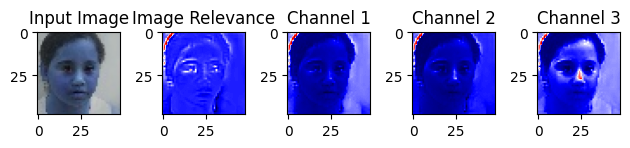

Contribution of pixels in the range [ 0.0 0.1 ] is :  18
Contribution of pixels in the range [ 0.1 0.2 ] is :  187
Contribution of pixels in the range [ 0.2 0.3 ] is :  6156
Contribution of pixels in the range [ 0.3 0.4 ] is :  420
Contribution of pixels in the range [ 0.4 0.5 ] is :  81
Contribution of pixels in the range [ 0.5 0.6 ] is :  24
Contribution of pixels in the range [ 0.6 0.7 ] is :  14
Contribution of pixels in the range [ 0.7 0.8 ] is :  5
Contribution of pixels in the range [ 0.8 0.9 ] is :  4
Contribution of pixels in the range [ 0.9 1.0 ] is :  2
Emotion Rank: Low
Rank and Label: Low sad
-------------------------------------------------------------------------------------------------------


In [100]:
import cv2
import numpy as np
import torch

# Specify the location of the input image
# image_path = "/content/test_dir/fear/S050_001_00000015.png"
# image_path = '/content/10_image0001794_Anger.jpg'
image_path = '/content/resized_sad.jpg'
# image_path ='/content/10_image0001794_Anger.jpg'
pred_label ="sad"

# Load the input image using OpenCV
image_data = cv2.imread(image_path)


# Normalize the pixel values of the image array
image_data = image_data.astype(np.float32) / 255.0

# Convert the image to a PyTorch tensor and reshape it
image_data = torch.tensor(image_data).permute(2, 0, 1).unsqueeze(0).float()

# Assuming you have the device defined somewhere in your code
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Transfer the image tensor to the appropriate device
inputs = image_data.to(device)

# Get model predictions for the input image
outputs = model(inputs).max(1).indices.detach().cpu().numpy()

try:
    # Compute relevance scores using the model
    image_relevances = apply_lrp_on_vgg16(model, inputs[0])
    image_relevances = image_relevances.permute(0, 2, 3, 1).detach().cpu().numpy()[0]
    image_relevances = np.interp(image_relevances, (image_relevances.min(), image_relevances.max()), (0, 1))

    # Compute pixel relevance scores
    pixel_relevance_scores = inputs[0].detach().cpu().numpy() * np.transpose(image_relevances, (2, 0, 1))

    # Visualize the input image and relevance scores
    plt.subplot(1, 5, 1)
    plt.imshow(inputs[0].permute(1, 2, 0).detach().cpu().numpy())
    plt.title("Input Image")

    plt.subplot(1, 5, 2)
    plt.imshow(image_relevances[:, :, 0], cmap="seismic")
    plt.title("Image Relevance")

    plt.subplot(1, 5, 3)
    plt.imshow(pixel_relevance_scores[0], cmap="seismic")
    plt.title("Channel 1")

    plt.subplot(1, 5, 4)
    plt.imshow(pixel_relevance_scores[1], cmap="seismic")
    plt.title("Channel 2")

    plt.subplot(1, 5, 5)
    plt.imshow(pixel_relevance_scores[2], cmap="seismic")
    plt.title("Channel 3")

    plt.tight_layout()
    plt.show()

    # Compute intensity
    # intensity = calculate_intensity(image_relevances)
    # print("Intensity:", intensity)
    intensity = calculate_range_by_mean5(image_relevances)
    print("Emotion Rank:", intensity)
    print("Rank and Label:",intensity+" "+pred_label)
    print("-------------------------------------------------------------------------------------------------------")

    # Additional processing if needed
    # For example, you can compute other metrics or perform further analysis

except TypeError:
    print("Error occurred during relevance score computation.")
